In [17]:
from matplotlib import pyplot as plt

# USAGE
# python recognize_faces_image.py --encodings encodings.pickle --image examples/example_01.png 

# import the necessary packages
import face_recognition
import pickle
import cv2
from imutils import paths # to get paths
import os
import numpy
import time
import pandas as pd

# for cross-functions
from cv2 import dnn_superres
from matplotlib import pyplot as plt
from PIL import Image
import warnings

def show_image(title, img):
      show = img[:,:,::-1] # needed to reverse colour properly. select all the elements on the first axis, all the elements on the seconds, and then the reverse of the elements on the third axis.
      plt.imshow(show)
      plt.title(title)
      plt.show()

def optimizeImage(imagePath, modelPath):
    # Create an SR object
    sr = dnn_superres.DnnSuperResImpl_create()
    
    # Get model name, get text between '/' & '_'
    modelName = modelPath.split('/')[1].split('_')[0].lower()

    # Get scale
    scale = int(modelPath.split('/')[1].split('_')[1].split('.')[0][1])

    # Display the name and scale
    # print("Model name: "+ modelName)
    # print("Model scale: " + str(modelScale))

    # Read image
    image = cv2.imread(imagePath)
    
    # Read the desired model
    sr.readModel(modelPath)

    # Set the desired model and scale to get correct pre- and post-processing
    sr.setModel(modelName, scale)

    # Upscale the image
    result = sr.upsample(image)

    # Save the image (optional)
    #cv2.imwrite("./examples/upscaled-fsrcnn_x4.jpg", result)
    
    return result

## for use in bicubic START
def scaleImage(imagePath, factor, algorithm):
    # Read image
    image = Image.open(imagePath)
    imgSize = (image.width * factor, image.height * factor)

    # Upscale the image
    result = image.resize(imgSize, algorithm)

    return result

# for non-opencv use
def display_image(title, img):
      plt.imshow(img)
      plt.title(title)
      plt.show()
## for use in bicubic END

# detection_mode: # variable for setting detection method, either: 'scale', 'ai', or anything else for 'direct'
def recognize_face(detection_mode):
    # benchmark time
    start_time = time.time()
    # variables for detection accuracy
    identify_correct = 0
    identify_wrong = 0
    identify_none = 0
    
    # Load the model
    # load the known faces and embeddings
    print("[INFO] loading encodings...")
    clf = pickle.loads(open(args["encodings"], "rb").read())
    
    for imagePath in imagePaths:
        if (detection_mode == "scale"):
            pil_img = scaleImage(imagePath, 4, Image.BICUBIC)
            image = cv2.cvtColor(numpy.array(pil_img), cv2.COLOR_RGB2BGR)
            # print("scaling")
        elif (detection_mode == "ai"):
            image = optimizeImage(imagePath, "models/EDSR_x4.pb")
            # print("ai")
        else:
            pil_img = scaleImage(imagePath, 4, Image.NEAREST)
            image = cv2.cvtColor(numpy.array(pil_img), cv2.COLOR_RGB2BGR)
            # print("direct")
            
        rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # detect the (x, y)-coordinates of the bounding boxes corresponding
        # to each face in the input image, then compute the facial embeddings
        # for each face
        print("[INFO] recognizing faces in ", imagePath)
        boxes = face_recognition.face_locations(rgb, model=args["detection_method"])
        encodings = face_recognition.face_encodings(rgb, boxes)
        # initialize the list of names for each face detected
        names = []
        
        for encoding in encodings:
            name = "Unknown"
            name = clf.predict([encoding])[0]
            names.append(name)

        # loop over the recognized faces
        for ((top, right, bottom, left), name) in zip(boxes, names):
            # draw the predicted face name on the image
            cv2.rectangle(image, (left, top), (right, bottom), (0, 0, 255), 1)
            y = top - 15 if top - 15 > 15 else top + 15
            print(name)
            cv2.putText(image, name, (left, y), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 255, 0), 2)

        # show the output image
        # cv2.namedWindow("Image", cv2.WINDOW_NORMAL) 
        # cv2.imshow("Image", image)
        # cv2.waitKey(0)
        # cv2.destroyAllWindows()
        
        correctName = [imagePath.split(os.path.sep)[3]] # 0 is root directory, 1 is subfolder (name), 2 is image name

        if names == correctName:
            print("Correct face recognized")
            identify_correct += 1
        else:
            print("Folder name is: ", correctName, ". However, face detected is:", names)
            if names: #implicit booliness
                identify_wrong += 1
            else:
                identify_none += 1
        img2 = image[:,:,::-1] # needed to reverse colour properly. select all the elements on the first axis, all the elements on the seconds, and then the reverse of the elements on the third axis.
        plt.imshow(img2)
        plt.title(imagePath)
        print(imagePath)
        plt.show()

    totalPictures = len(imagePaths)
    if (totalPictures > 0):
        print("Summary")
        print("==========================")
        print("Total pictures", totalPictures)
        print("Faces identified correctly: ", identify_correct)
        print("Faces identified wrongly: ", identify_wrong)
        print("Faces not identified: ", identify_none)
        print("Absolute Accuracy (correct / [correct + incorrect + not detected]) * 100%: ")
        print(round(identify_correct / (identify_correct + identify_wrong + identify_none), 2) * 100, "%")
        print("Detection Accuracy [(correct + incorrect) / total] * 100%: ")
        print(round(((identify_correct + identify_wrong) / totalPictures) * 100, 2), "%")
        print("END, time taken: ", round((time.time() - start_time), 2), "seconds")
        print("Avg. secs. per picture: ", round((time.time() - start_time) / totalPictures, 2), "seconds")
        print("==========================")
    else:
        print("[INFO] No detections made. No pictures found.")
    
args = {}
args["encodings"] = "models/svm-face.pickle"
args["dataset"] = "./dataset/test"
args["detection_method"] = "hog"
imagePaths = list(paths.list_images(args["dataset"]))
# print(imagePaths)
print("Arguments set!")

Arguments set!


Face identification: Direct without any image enhancement
[INFO] loading encodings...
[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0013.jpg
Roh_Moo-hyun
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0013.jpg


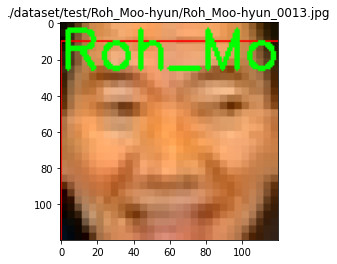

[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0011.jpg
Roh_Moo-hyun
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0011.jpg


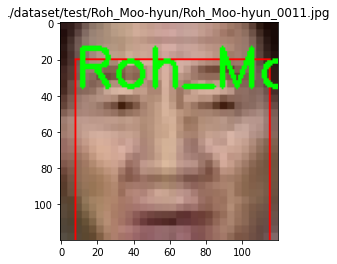

[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0012.jpg
Roh_Moo-hyun
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0012.jpg


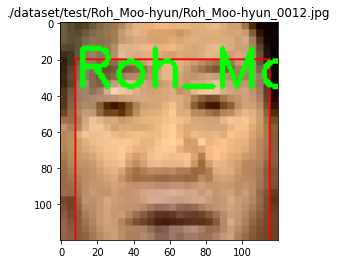

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0011.jpg
Folder name is:  ['Gloria_Macapagal_Arroyo'] . However, face detected is: []
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0011.jpg


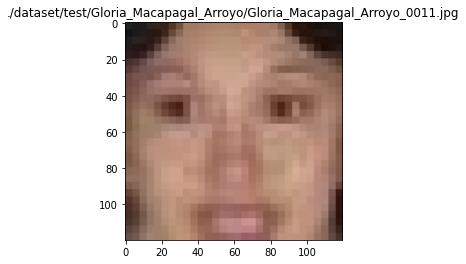

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0012.jpg
Gloria_Macapagal_Arroyo
Correct face recognized
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0012.jpg


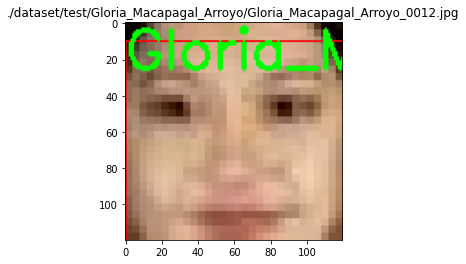

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0013.jpg
Megawati_Sukarnoputri
Folder name is:  ['Gloria_Macapagal_Arroyo'] . However, face detected is: ['Megawati_Sukarnoputri']
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0013.jpg


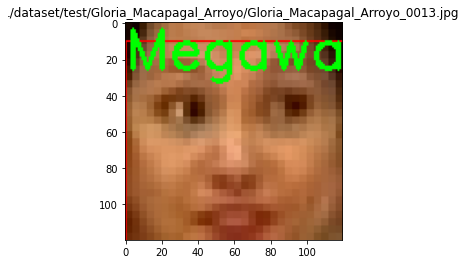

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0011.jpg
Hans_Blix
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0011.jpg


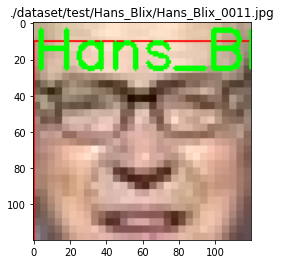

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0012.jpg
Hans_Blix
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0012.jpg


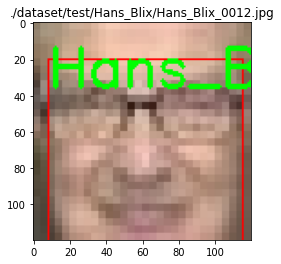

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0013.jpg
Hans_Blix
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0013.jpg


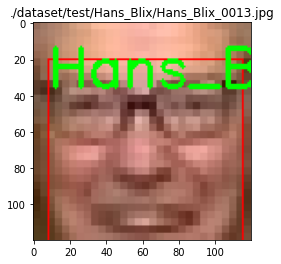

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0012.jpg
Silvio_Berlusconi
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0012.jpg


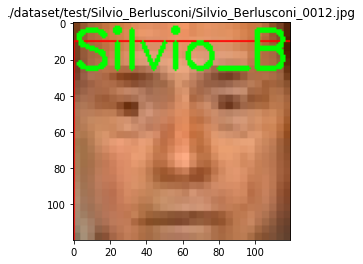

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0011.jpg
Silvio_Berlusconi
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0011.jpg


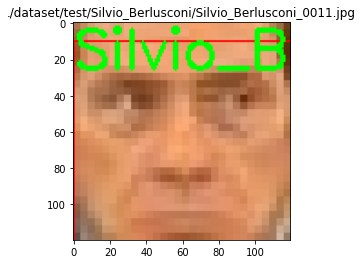

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0013.jpg
Silvio_Berlusconi
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0013.jpg


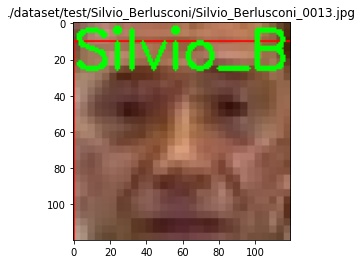

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0012.jpg
Laura_Bush
Correct face recognized
./dataset/test/Laura_Bush/Laura_Bush_0012.jpg


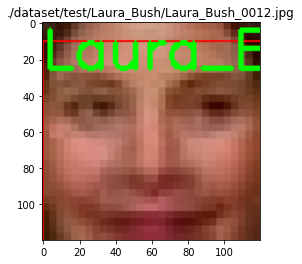

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0013.jpg
Laura_Bush
Correct face recognized
./dataset/test/Laura_Bush/Laura_Bush_0013.jpg


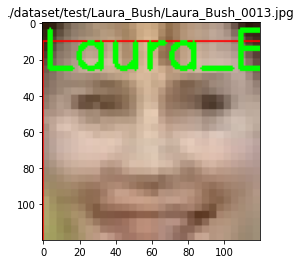

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0011.jpg
Laura_Bush
Correct face recognized
./dataset/test/Laura_Bush/Laura_Bush_0011.jpg


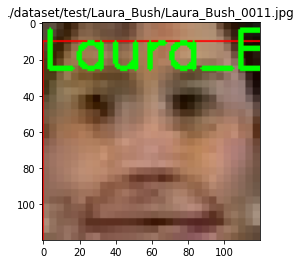

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0013.jpg
Unknown
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Unknown']
./dataset/test/John_Ashcroft/John_Ashcroft_0013.jpg


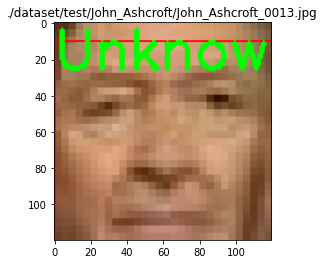

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0012.jpg
Unknown
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Unknown']
./dataset/test/John_Ashcroft/John_Ashcroft_0012.jpg


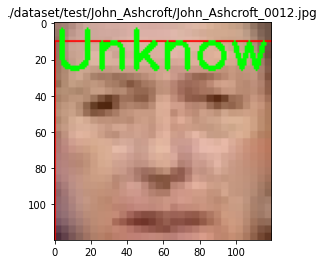

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0011.jpg
Unknown
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Unknown']
./dataset/test/John_Ashcroft/John_Ashcroft_0011.jpg


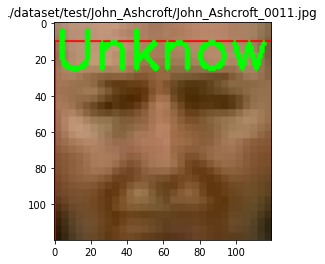

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0013.jpg
Tom_Ridge
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0013.jpg


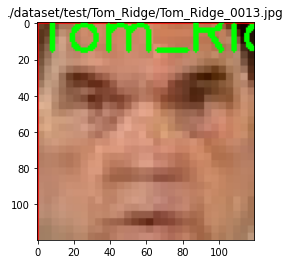

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0012.jpg
Tom_Ridge
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0012.jpg


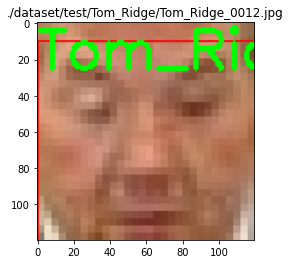

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0011.jpg
Tom_Ridge
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0011.jpg


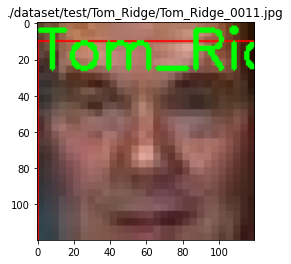

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0012.jpg
Andre_Agassi
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0012.jpg


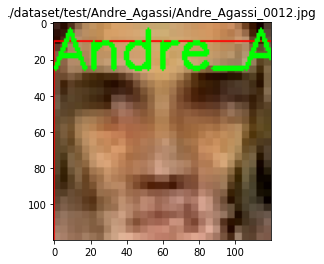

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0011.jpg
Andre_Agassi
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0011.jpg


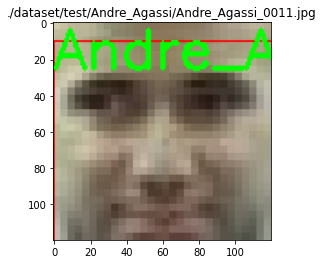

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0013.jpg
Andre_Agassi
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0013.jpg


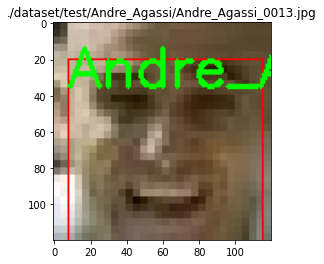

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0011.jpg
Vicente_Fox
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0011.jpg


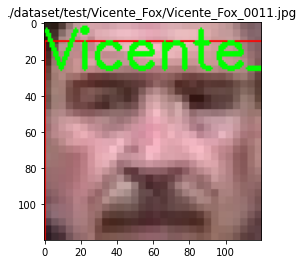

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0013.jpg
Vicente_Fox
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0013.jpg


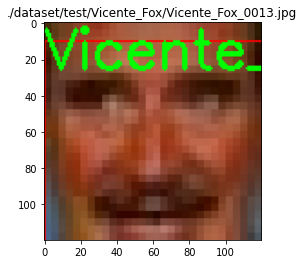

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0012.jpg
Vicente_Fox
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0012.jpg


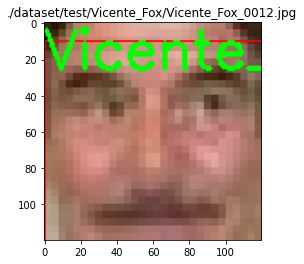

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0012.jpg
Colin_Powell
Correct face recognized
./dataset/test/Colin_Powell/Colin_Powell_0012.jpg


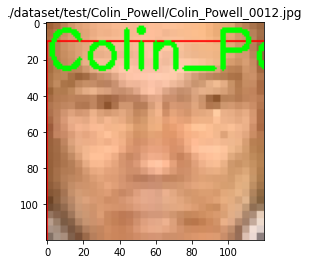

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0013.jpg
Tony_Blair
Folder name is:  ['Colin_Powell'] . However, face detected is: ['Tony_Blair']
./dataset/test/Colin_Powell/Colin_Powell_0013.jpg


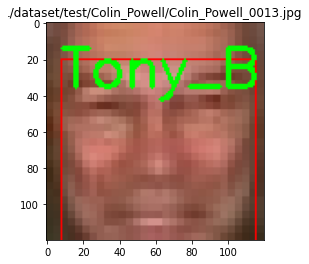

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0011.jpg
Colin_Powell
Correct face recognized
./dataset/test/Colin_Powell/Colin_Powell_0011.jpg


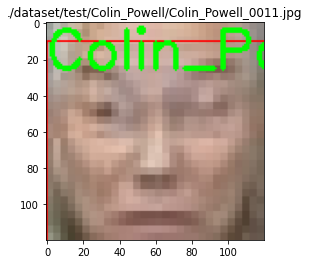

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0011.jpg
Unknown
Folder name is:  ['Luiz_Inacio_Lula_da_Silva'] . However, face detected is: ['Unknown']
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0011.jpg


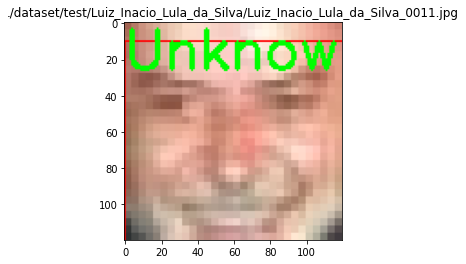

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0012.jpg
Luiz_Inacio_Lula_da_Silva
Correct face recognized
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0012.jpg


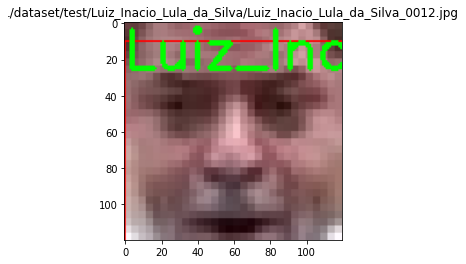

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0013.jpg
Unknown
Folder name is:  ['Luiz_Inacio_Lula_da_Silva'] . However, face detected is: ['Unknown']
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0013.jpg


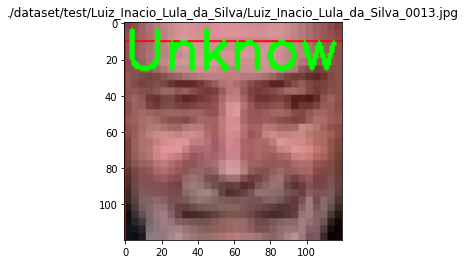

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0012.jpg
Alejandro_Toledo
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0012.jpg


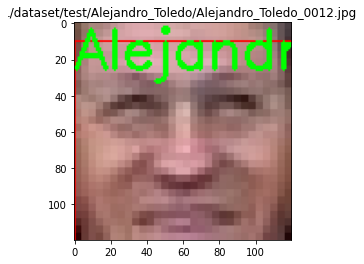

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0011.jpg
Alejandro_Toledo
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0011.jpg


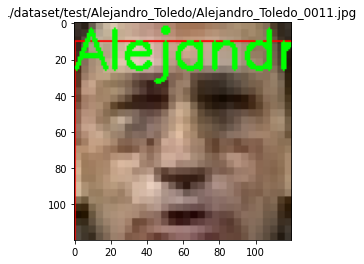

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0013.jpg
Alejandro_Toledo
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0013.jpg


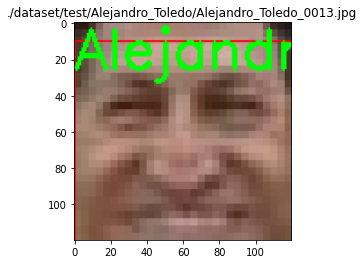

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0011.jpg
Megawati_Sukarnoputri
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0011.jpg


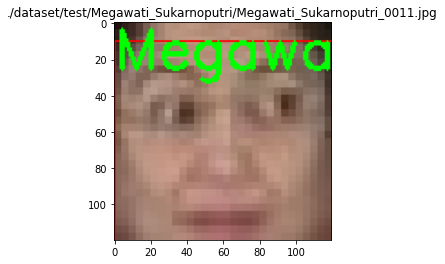

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0013.jpg
Megawati_Sukarnoputri
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0013.jpg


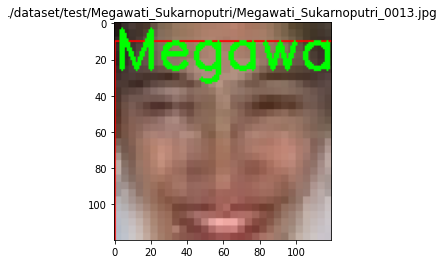

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0012.jpg
Megawati_Sukarnoputri
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0012.jpg


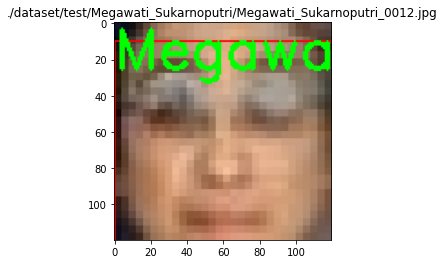

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0013.jpg
Lleyton_Hewitt
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0013.jpg


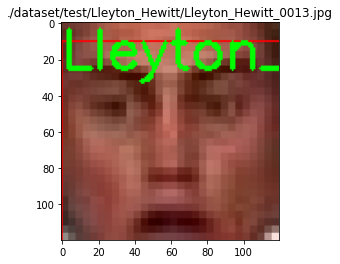

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0011.jpg
Lleyton_Hewitt
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0011.jpg


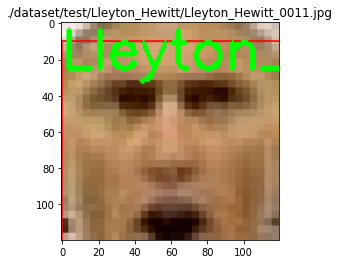

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0012.jpg
Lleyton_Hewitt
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0012.jpg


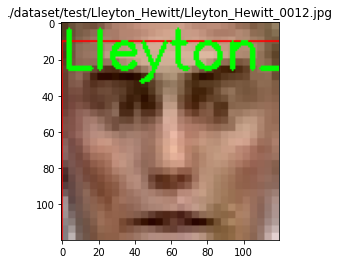

[INFO] recognizing faces in  ./dataset/test/Unknown/Aaron_Eckhart_A.jpg
Alvaro_Uribe
Folder name is:  ['Unknown'] . However, face detected is: ['Alvaro_Uribe']
./dataset/test/Unknown/Aaron_Eckhart_A.jpg


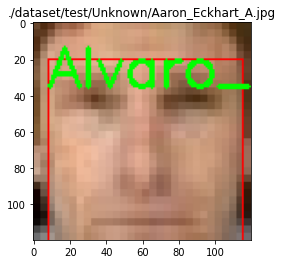

[INFO] recognizing faces in  ./dataset/test/Unknown/Aaron_Guiel_B.jpg
Folder name is:  ['Unknown'] . However, face detected is: []
./dataset/test/Unknown/Aaron_Guiel_B.jpg


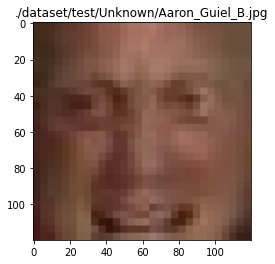

[INFO] recognizing faces in  ./dataset/test/Unknown/Adriana_Lima_C.jpg
Unknown
Correct face recognized
./dataset/test/Unknown/Adriana_Lima_C.jpg


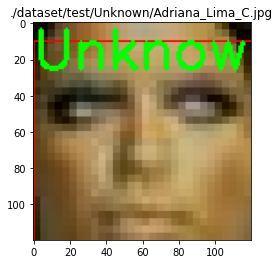

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0013.jpg
George_W_Bush
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0013.jpg


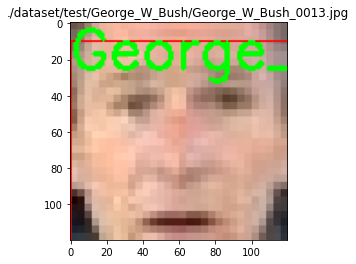

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0011.jpg
George_W_Bush
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0011.jpg


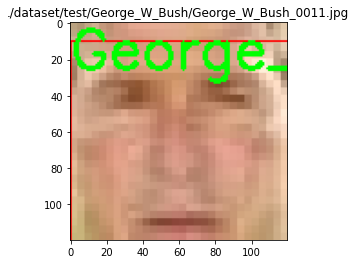

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0012.jpg
George_W_Bush
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0012.jpg


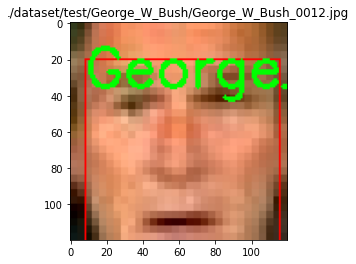

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0012.jpg
Nestor_Kirchner
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0012.jpg


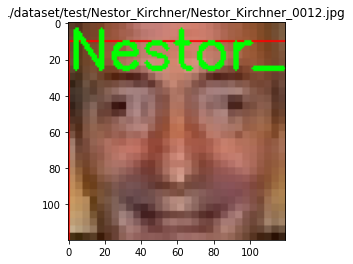

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0013.jpg
Nestor_Kirchner
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0013.jpg


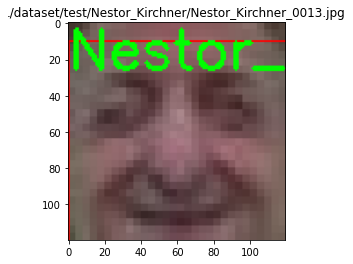

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0011.jpg
Nestor_Kirchner
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0011.jpg


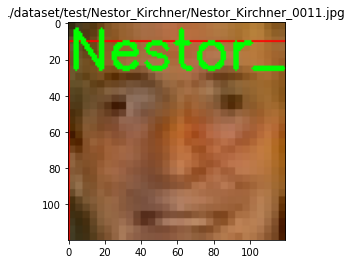

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0012.jpg
Alvaro_Uribe
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0012.jpg


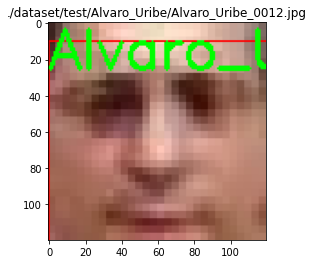

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0011.jpg
Alvaro_Uribe
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0011.jpg


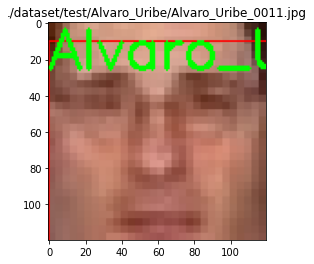

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0013.jpg
Alvaro_Uribe
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0013.jpg


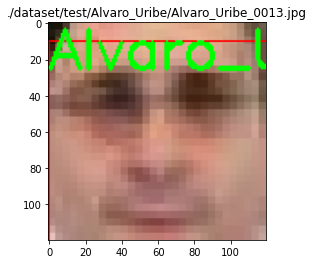

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0011.jpg
Tony_Blair
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0011.jpg


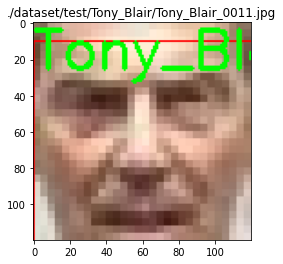

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0012.jpg
Tony_Blair
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0012.jpg


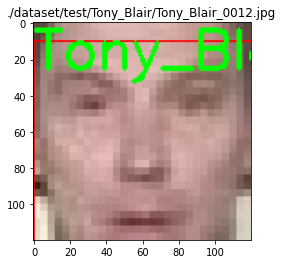

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0013.jpg
Tony_Blair
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0013.jpg


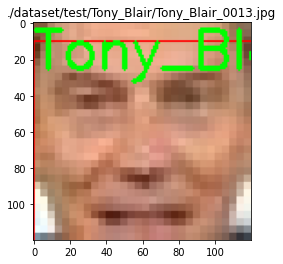

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0011.jpg
Kofi_Annan
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0011.jpg


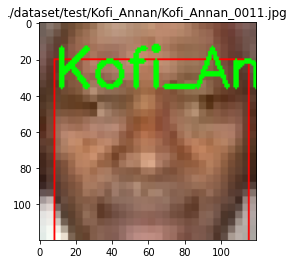

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0013.jpg
Kofi_Annan
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0013.jpg


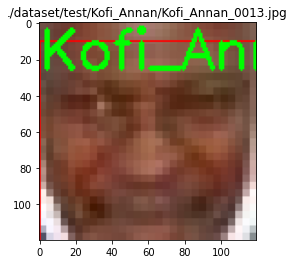

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0012.jpg
Kofi_Annan
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0012.jpg


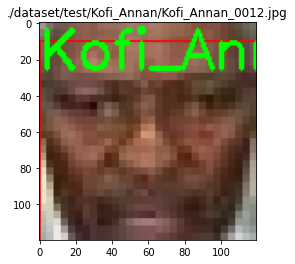

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0012.jpg
Arnold_Schwarzenegger
Correct face recognized
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0012.jpg


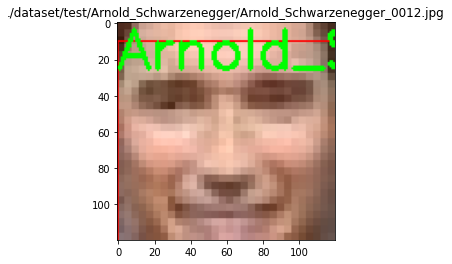

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0011.jpg
Folder name is:  ['Arnold_Schwarzenegger'] . However, face detected is: []
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0011.jpg


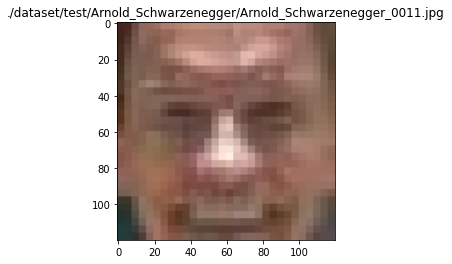

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0013.jpg
Alvaro_Uribe
Folder name is:  ['Arnold_Schwarzenegger'] . However, face detected is: ['Alvaro_Uribe']
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0013.jpg


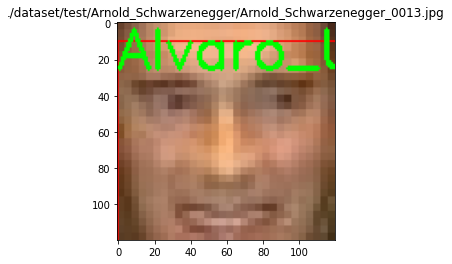

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0011.jpg
Jacques_Chirac
Correct face recognized
./dataset/test/Jacques_Chirac/Jacques_Chirac_0011.jpg


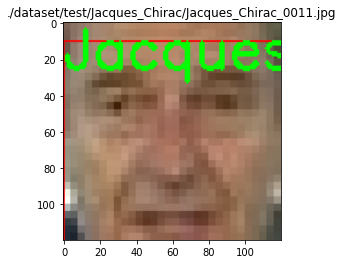

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0013.jpg
Alvaro_Uribe
Folder name is:  ['Jacques_Chirac'] . However, face detected is: ['Alvaro_Uribe']
./dataset/test/Jacques_Chirac/Jacques_Chirac_0013.jpg


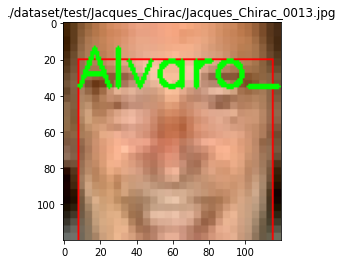

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0012.jpg
Jacques_Chirac
Correct face recognized
./dataset/test/Jacques_Chirac/Jacques_Chirac_0012.jpg


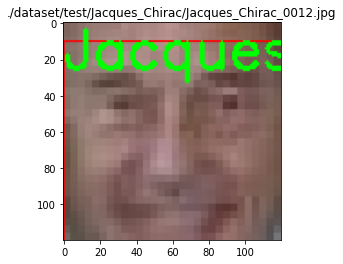

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0011.jpg
Donald_Rumsfeld
Correct face recognized
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0011.jpg


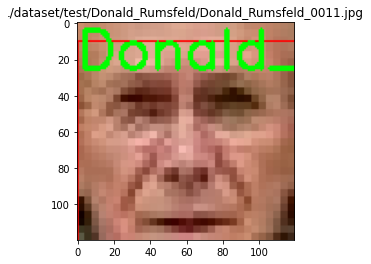

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0013.jpg
Unknown
Folder name is:  ['Donald_Rumsfeld'] . However, face detected is: ['Unknown']
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0013.jpg


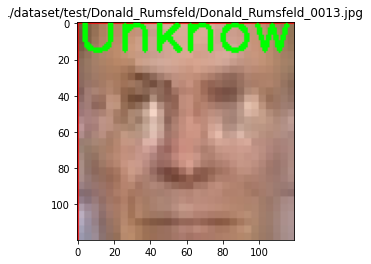

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0012.jpg
Donald_Rumsfeld
Correct face recognized
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0012.jpg


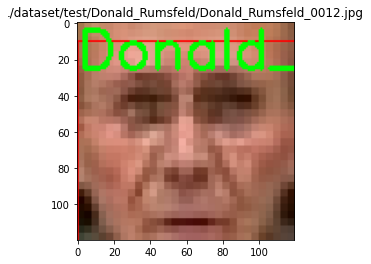

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0013.jpg
Ariel_Sharon
Correct face recognized
./dataset/test/Ariel_Sharon/Ariel_Sharon_0013.jpg


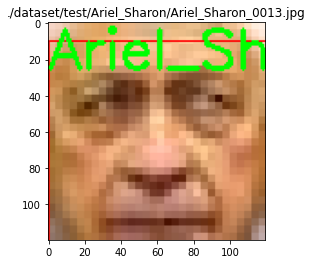

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0011.jpg
Ariel_Sharon
Correct face recognized
./dataset/test/Ariel_Sharon/Ariel_Sharon_0011.jpg


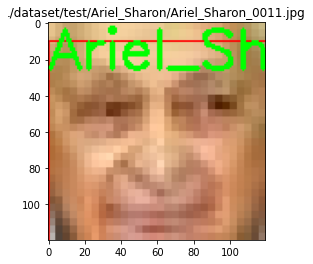

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0012.jpg
Unknown
Folder name is:  ['Ariel_Sharon'] . However, face detected is: ['Unknown']
./dataset/test/Ariel_Sharon/Ariel_Sharon_0012.jpg


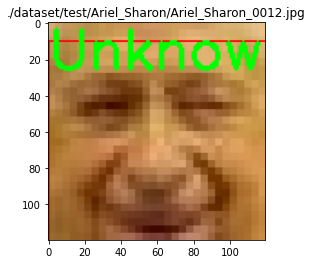

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0011.jpg
Hugo_Chavez
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0011.jpg


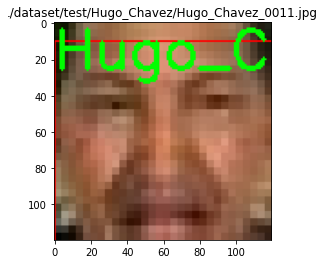

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0012.jpg
Hugo_Chavez
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0012.jpg


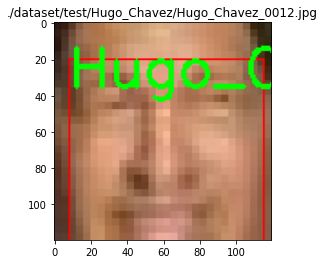

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0013.jpg
Hugo_Chavez
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0013.jpg


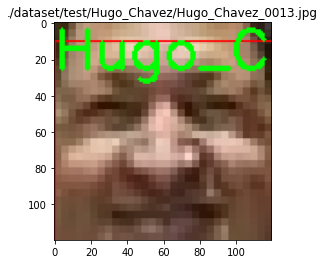

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0013.jpg
Serena_Williams
Correct face recognized
./dataset/test/Serena_Williams/Serena_Williams_0013.jpg


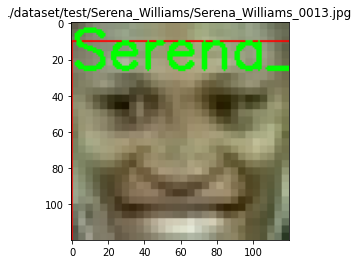

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0011.jpg
Folder name is:  ['Serena_Williams'] . However, face detected is: []
./dataset/test/Serena_Williams/Serena_Williams_0011.jpg


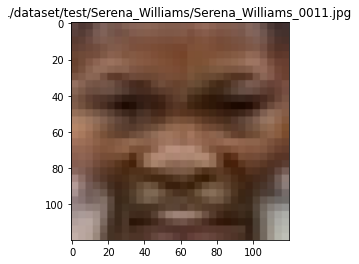

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0012.jpg
Folder name is:  ['Serena_Williams'] . However, face detected is: []
./dataset/test/Serena_Williams/Serena_Williams_0012.jpg


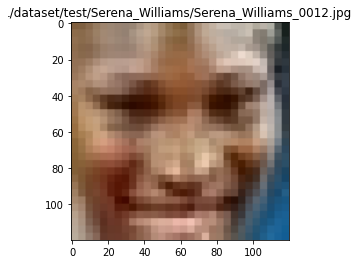

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0013.jpg
Jean_Chretien
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0013.jpg


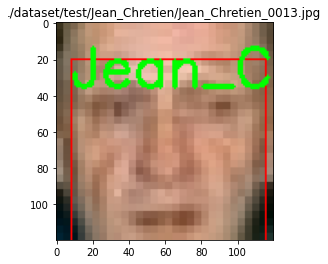

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0011.jpg
Jean_Chretien
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0011.jpg


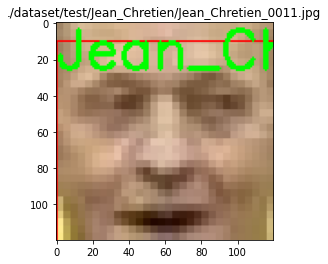

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0012.jpg
Jean_Chretien
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0012.jpg


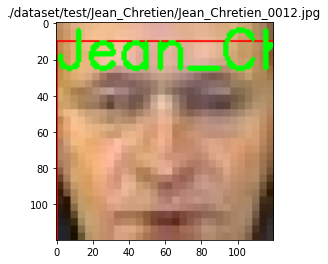

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0012.jpg
Gerhard_Schroeder
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0012.jpg


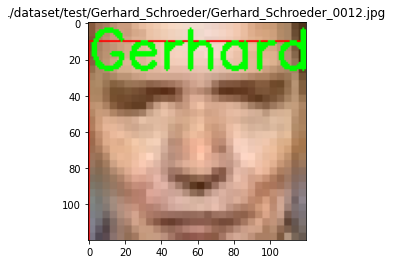

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0013.jpg
Gerhard_Schroeder
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0013.jpg


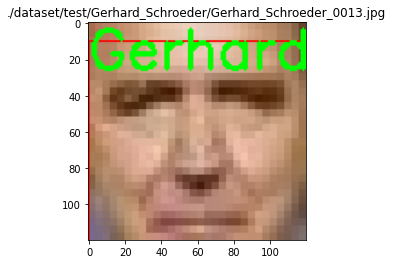

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0011.jpg
Gerhard_Schroeder
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0011.jpg


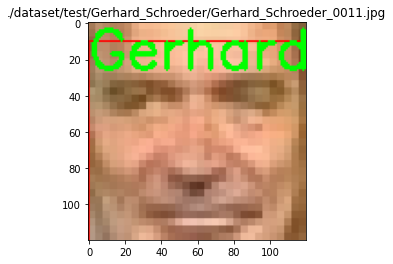

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0011.jpg
Junichiro_Koizumi
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0011.jpg


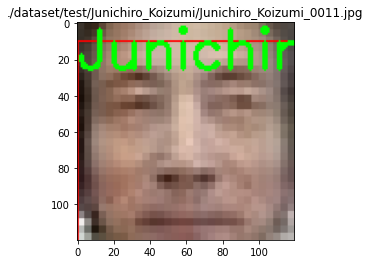

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0013.jpg
Junichiro_Koizumi
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0013.jpg


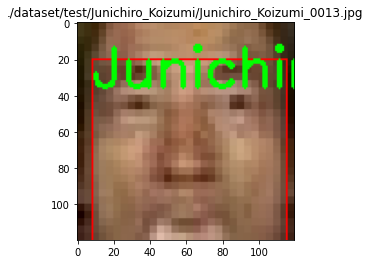

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0012.jpg
Junichiro_Koizumi
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0012.jpg


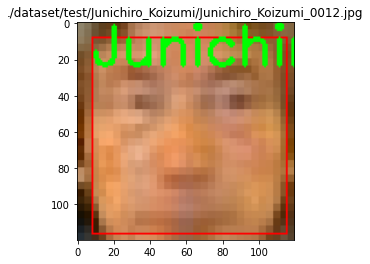

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0013.jpg
Jennifer_Capriati
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0013.jpg


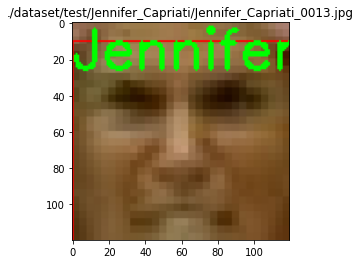

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0011.jpg
Jennifer_Capriati
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0011.jpg


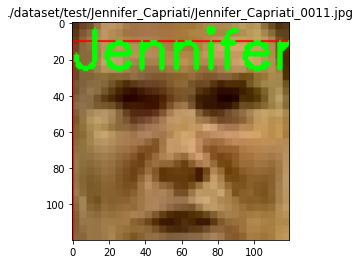

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0012.jpg
Jennifer_Capriati
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0012.jpg


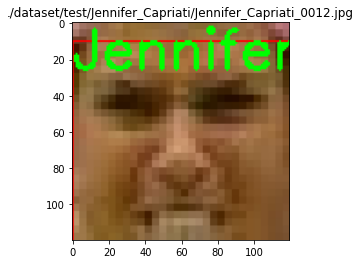

Summary
Total pictures 90
Faces identified correctly:  73
Faces identified wrongly:  12
Faces not identified:  5
Absolute Accuracy (correct / [correct + incorrect + not detected]) * 100%: 
81.0 %
Detection Accuracy [(correct + incorrect) / total] * 100%: 
94.44 %
END, time taken:  53.48 seconds
Avg. secs. per picture:  0.59 seconds


In [18]:
print("Face identification: Direct without any image enhancement")
print("=========================================================")
recognize_face("direct")

[INFO] loading encodings...
[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0013.jpg
Roh_Moo-hyun
Name coreect
['Roh_Moo-hyun']
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0013.jpg


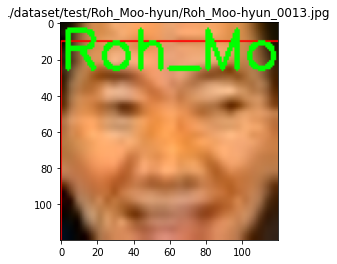

[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0011.jpg
Roh_Moo-hyun
Name coreect
['Roh_Moo-hyun']
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0011.jpg


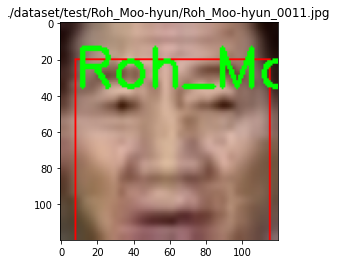

[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0012.jpg
Roh_Moo-hyun
Name coreect
['Roh_Moo-hyun']
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0012.jpg


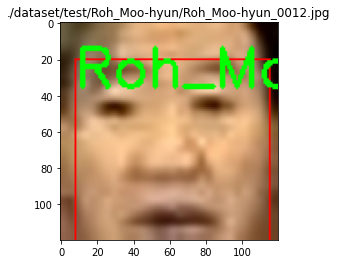

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0011.jpg
Gloria_Macapagal_Arroyo
Name coreect
['Gloria_Macapagal_Arroyo']
Correct face recognized
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0011.jpg


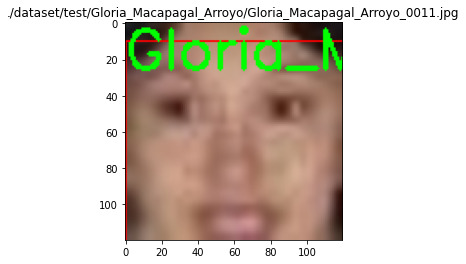

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0012.jpg
Gloria_Macapagal_Arroyo
Name coreect
['Gloria_Macapagal_Arroyo']
Correct face recognized
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0012.jpg


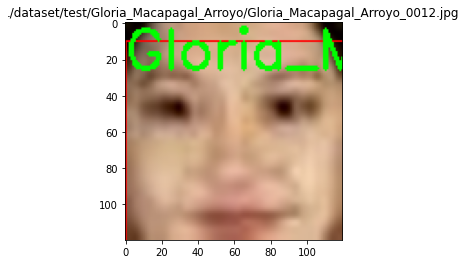

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0013.jpg
Gloria_Macapagal_Arroyo
Name coreect
['Gloria_Macapagal_Arroyo']
Correct face recognized
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0013.jpg


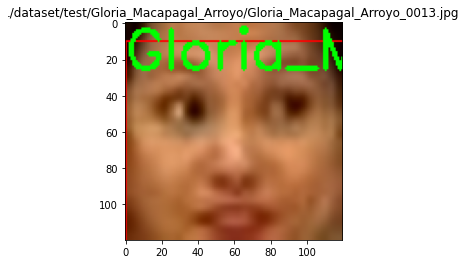

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0011.jpg
Hans_Blix
Name coreect
['Hans_Blix']
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0011.jpg


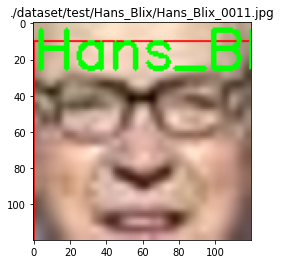

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0012.jpg
Hans_Blix
Name coreect
['Hans_Blix']
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0012.jpg


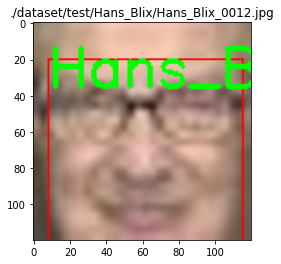

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0013.jpg
Hans_Blix
Name coreect
['Hans_Blix']
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0013.jpg


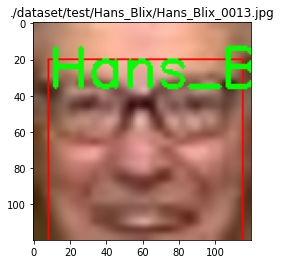

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0012.jpg
Silvio_Berlusconi
Name coreect
['Silvio_Berlusconi']
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0012.jpg


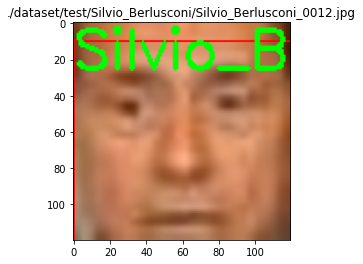

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0011.jpg
Silvio_Berlusconi
Name coreect
['Silvio_Berlusconi']
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0011.jpg


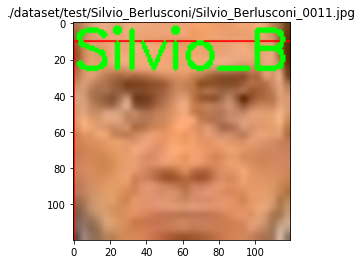

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0013.jpg
Silvio_Berlusconi
Name coreect
['Silvio_Berlusconi']
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0013.jpg


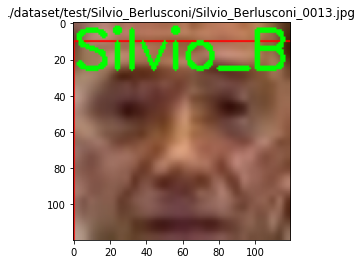

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0012.jpg
Laura_Bush
Name coreect
['Laura_Bush']
Correct face recognized
./dataset/test/Laura_Bush/Laura_Bush_0012.jpg


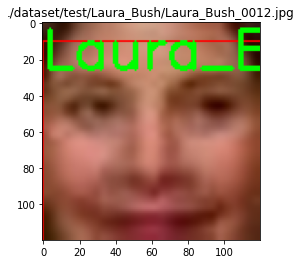

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0013.jpg
Laura_Bush
Name coreect
['Laura_Bush']
Correct face recognized
./dataset/test/Laura_Bush/Laura_Bush_0013.jpg


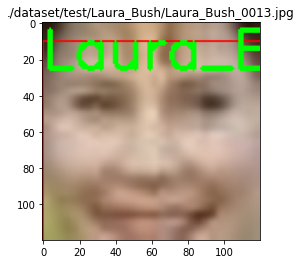

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0011.jpg
Name coreect
['Laura_Bush']
Folder name is:  ['Laura_Bush'] . However, face detected is: []
./dataset/test/Laura_Bush/Laura_Bush_0011.jpg


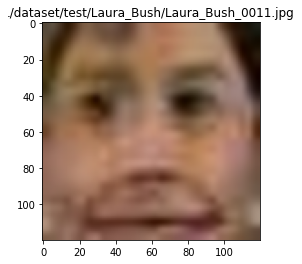

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0013.jpg
Unknown
Name coreect
['John_Ashcroft']
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Unknown']
./dataset/test/John_Ashcroft/John_Ashcroft_0013.jpg


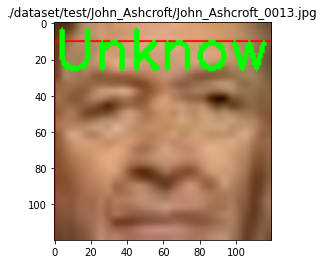

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0012.jpg
Unknown
Name coreect
['John_Ashcroft']
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Unknown']
./dataset/test/John_Ashcroft/John_Ashcroft_0012.jpg


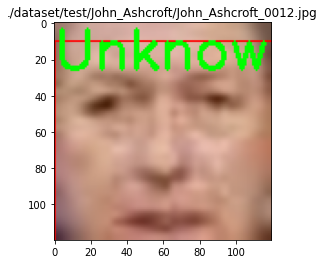

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0011.jpg
Unknown
Name coreect
['John_Ashcroft']
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Unknown']
./dataset/test/John_Ashcroft/John_Ashcroft_0011.jpg


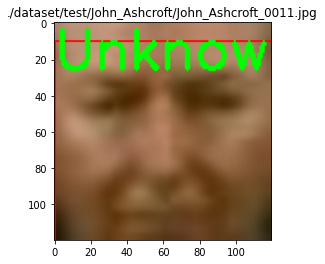

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0013.jpg
Tom_Ridge
Name coreect
['Tom_Ridge']
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0013.jpg


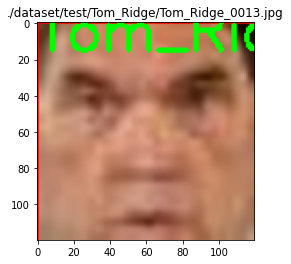

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0012.jpg
Tom_Ridge
Name coreect
['Tom_Ridge']
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0012.jpg


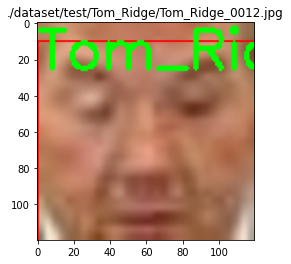

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0011.jpg
Tom_Ridge
Name coreect
['Tom_Ridge']
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0011.jpg


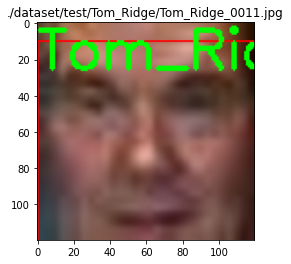

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0012.jpg
Andre_Agassi
Name coreect
['Andre_Agassi']
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0012.jpg


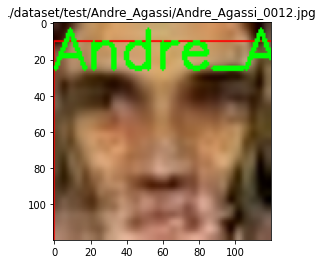

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0011.jpg
Andre_Agassi
Name coreect
['Andre_Agassi']
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0011.jpg


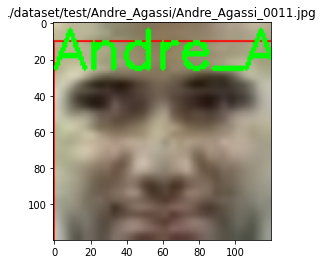

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0013.jpg
Andre_Agassi
Name coreect
['Andre_Agassi']
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0013.jpg


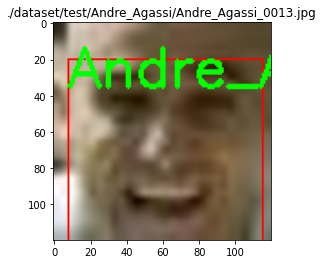

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0011.jpg
Vicente_Fox
Name coreect
['Vicente_Fox']
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0011.jpg


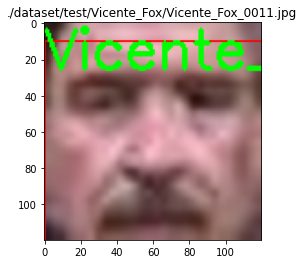

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0013.jpg
Vicente_Fox
Name coreect
['Vicente_Fox']
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0013.jpg


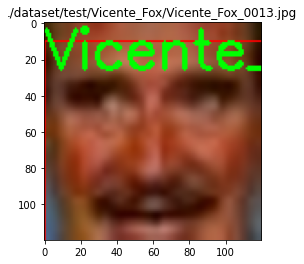

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0012.jpg
Vicente_Fox
Name coreect
['Vicente_Fox']
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0012.jpg


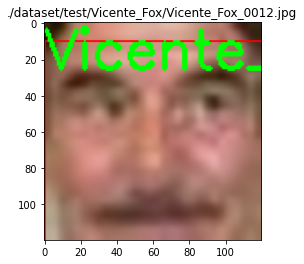

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0012.jpg
Arnold_Schwarzenegger
Name coreect
['Colin_Powell']
Folder name is:  ['Colin_Powell'] . However, face detected is: ['Arnold_Schwarzenegger']
./dataset/test/Colin_Powell/Colin_Powell_0012.jpg


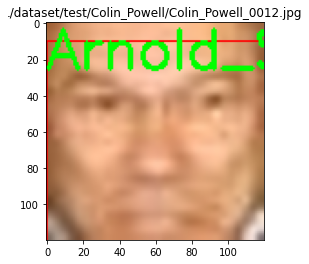

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0013.jpg
Tony_Blair
Name coreect
['Colin_Powell']
Folder name is:  ['Colin_Powell'] . However, face detected is: ['Tony_Blair']
./dataset/test/Colin_Powell/Colin_Powell_0013.jpg


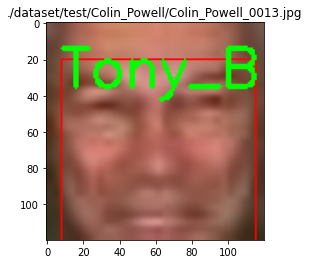

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0011.jpg
Tony_Blair
Name coreect
['Colin_Powell']
Folder name is:  ['Colin_Powell'] . However, face detected is: ['Tony_Blair']
./dataset/test/Colin_Powell/Colin_Powell_0011.jpg


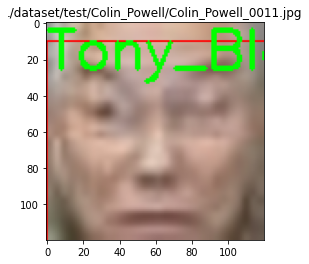

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0011.jpg
Unknown
Name coreect
['Luiz_Inacio_Lula_da_Silva']
Folder name is:  ['Luiz_Inacio_Lula_da_Silva'] . However, face detected is: ['Unknown']
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0011.jpg


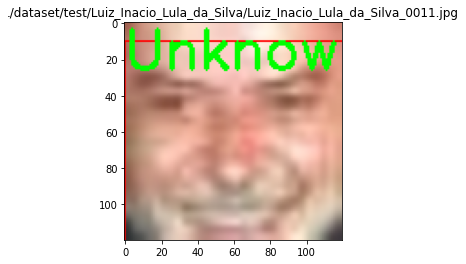

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0012.jpg
Luiz_Inacio_Lula_da_Silva
Name coreect
['Luiz_Inacio_Lula_da_Silva']
Correct face recognized
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0012.jpg


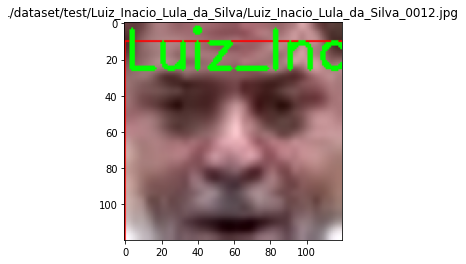

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0013.jpg
Unknown
Name coreect
['Luiz_Inacio_Lula_da_Silva']
Folder name is:  ['Luiz_Inacio_Lula_da_Silva'] . However, face detected is: ['Unknown']
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0013.jpg


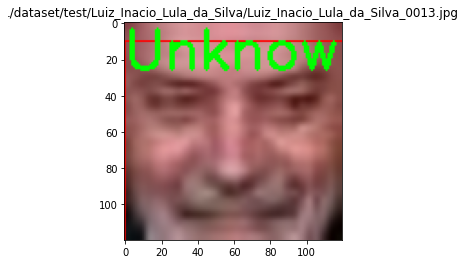

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0012.jpg
Alejandro_Toledo
Name coreect
['Alejandro_Toledo']
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0012.jpg


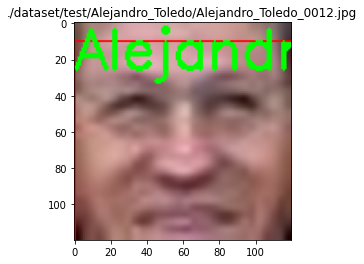

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0011.jpg
Alejandro_Toledo
Name coreect
['Alejandro_Toledo']
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0011.jpg


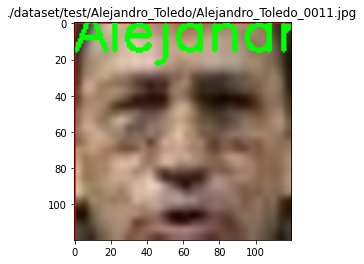

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0013.jpg
Alejandro_Toledo
Name coreect
['Alejandro_Toledo']
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0013.jpg


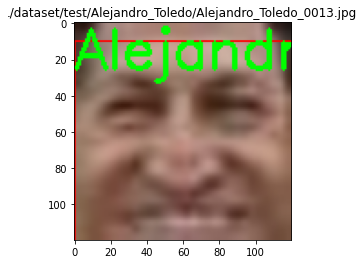

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0011.jpg
Megawati_Sukarnoputri
Name coreect
['Megawati_Sukarnoputri']
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0011.jpg


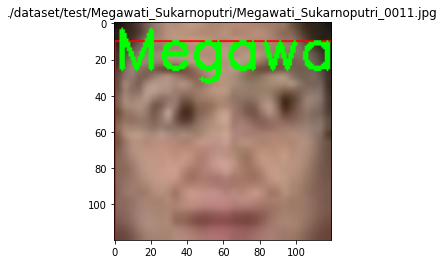

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0013.jpg
Megawati_Sukarnoputri
Name coreect
['Megawati_Sukarnoputri']
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0013.jpg


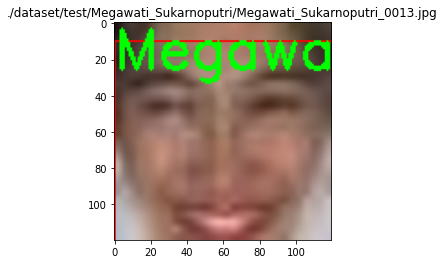

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0012.jpg
Megawati_Sukarnoputri
Name coreect
['Megawati_Sukarnoputri']
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0012.jpg


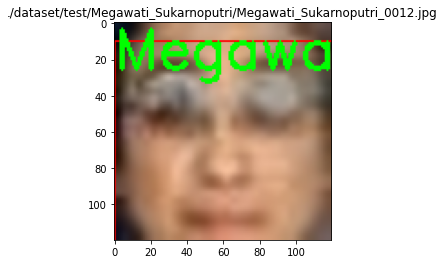

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0013.jpg
Lleyton_Hewitt
Name coreect
['Lleyton_Hewitt']
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0013.jpg


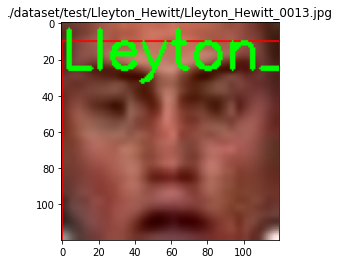

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0011.jpg
Lleyton_Hewitt
Name coreect
['Lleyton_Hewitt']
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0011.jpg


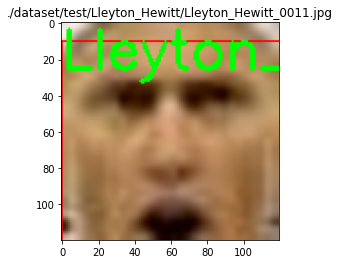

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0012.jpg
Lleyton_Hewitt
Name coreect
['Lleyton_Hewitt']
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0012.jpg


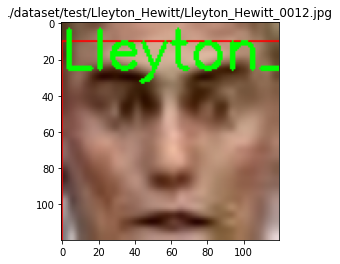

[INFO] recognizing faces in  ./dataset/test/Unknown/Aaron_Eckhart_A.jpg
Alvaro_Uribe
Name coreect
['Unknown']
Folder name is:  ['Unknown'] . However, face detected is: ['Alvaro_Uribe']
./dataset/test/Unknown/Aaron_Eckhart_A.jpg


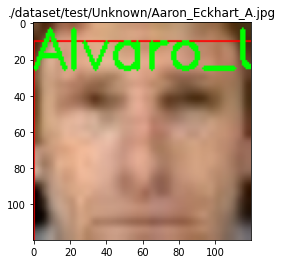

[INFO] recognizing faces in  ./dataset/test/Unknown/Aaron_Guiel_B.jpg
Name coreect
['Unknown']
Folder name is:  ['Unknown'] . However, face detected is: []
./dataset/test/Unknown/Aaron_Guiel_B.jpg


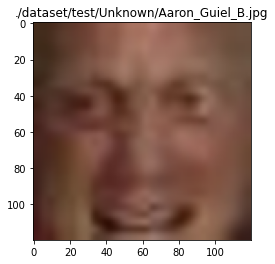

[INFO] recognizing faces in  ./dataset/test/Unknown/Adriana_Lima_C.jpg
Unknown
Name coreect
['Unknown']
Correct face recognized
./dataset/test/Unknown/Adriana_Lima_C.jpg


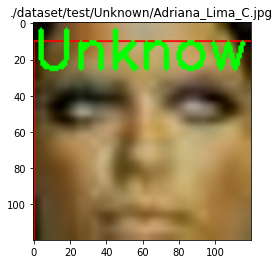

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0013.jpg
George_W_Bush
Name coreect
['George_W_Bush']
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0013.jpg


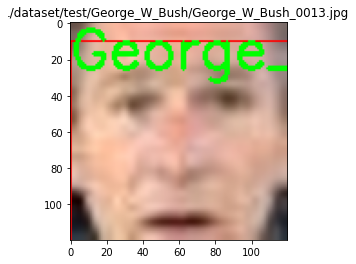

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0011.jpg
George_W_Bush
Name coreect
['George_W_Bush']
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0011.jpg


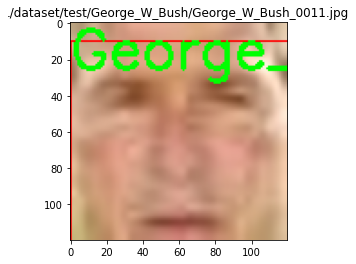

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0012.jpg
George_W_Bush
Name coreect
['George_W_Bush']
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0012.jpg


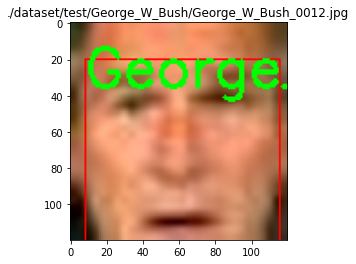

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0012.jpg
Nestor_Kirchner
Name coreect
['Nestor_Kirchner']
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0012.jpg


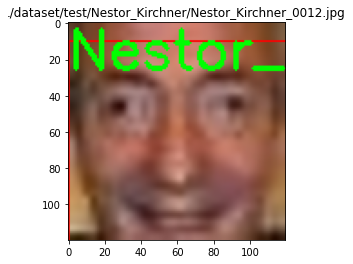

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0013.jpg
Nestor_Kirchner
Name coreect
['Nestor_Kirchner']
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0013.jpg


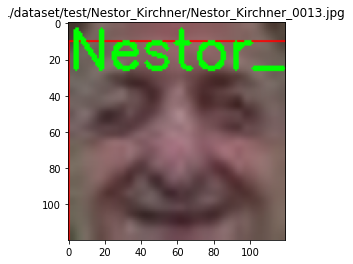

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0011.jpg
Nestor_Kirchner
Name coreect
['Nestor_Kirchner']
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0011.jpg


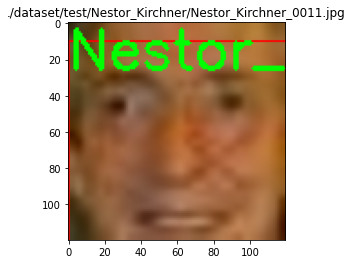

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0012.jpg
Alvaro_Uribe
Name coreect
['Alvaro_Uribe']
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0012.jpg


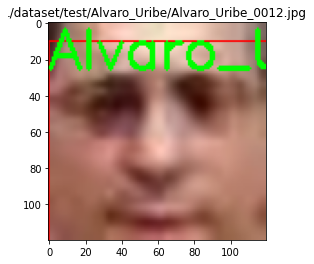

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0011.jpg
Alvaro_Uribe
Name coreect
['Alvaro_Uribe']
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0011.jpg


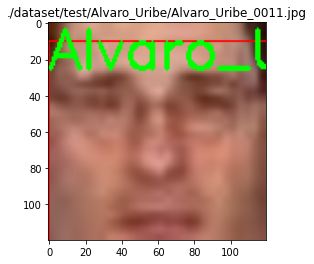

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0013.jpg
Alvaro_Uribe
Name coreect
['Alvaro_Uribe']
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0013.jpg


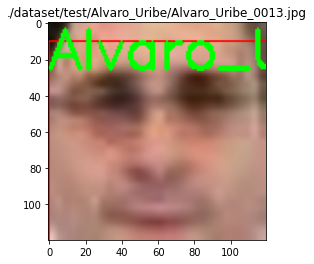

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0011.jpg
Tony_Blair
Name coreect
['Tony_Blair']
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0011.jpg


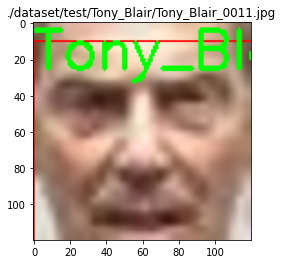

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0012.jpg
Tony_Blair
Name coreect
['Tony_Blair']
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0012.jpg


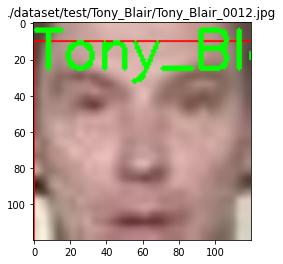

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0013.jpg
Tony_Blair
Name coreect
['Tony_Blair']
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0013.jpg


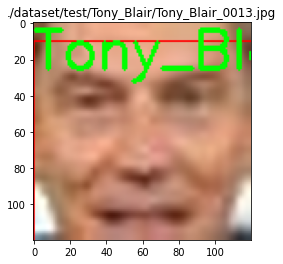

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0011.jpg
Kofi_Annan
Name coreect
['Kofi_Annan']
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0011.jpg


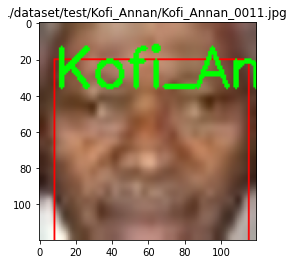

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0013.jpg
Kofi_Annan
Name coreect
['Kofi_Annan']
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0013.jpg


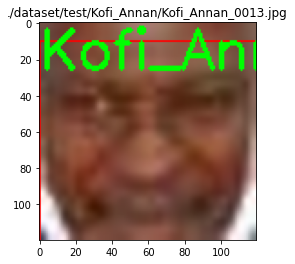

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0012.jpg
Kofi_Annan
Name coreect
['Kofi_Annan']
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0012.jpg


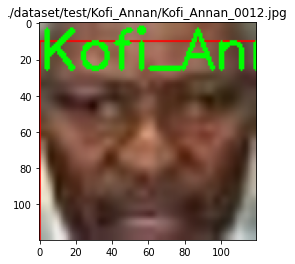

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0012.jpg
Arnold_Schwarzenegger
Name coreect
['Arnold_Schwarzenegger']
Correct face recognized
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0012.jpg


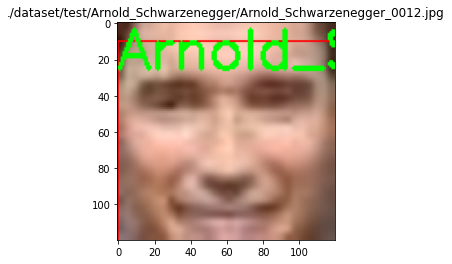

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0011.jpg
Name coreect
['Arnold_Schwarzenegger']
Folder name is:  ['Arnold_Schwarzenegger'] . However, face detected is: []
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0011.jpg


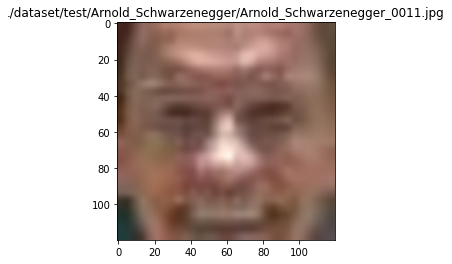

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0013.jpg
Arnold_Schwarzenegger
Name coreect
['Arnold_Schwarzenegger']
Correct face recognized
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0013.jpg


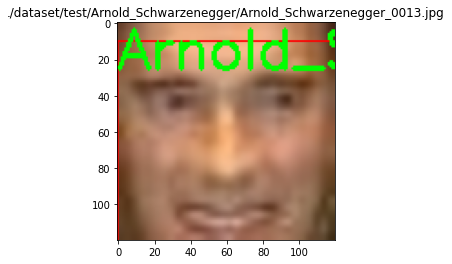

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0011.jpg
Jacques_Chirac
Name coreect
['Jacques_Chirac']
Correct face recognized
./dataset/test/Jacques_Chirac/Jacques_Chirac_0011.jpg


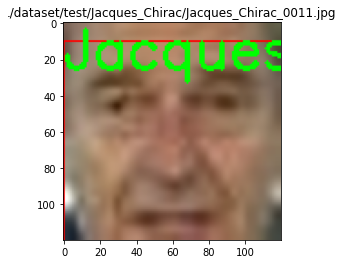

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0013.jpg
Jacques_Chirac
Name coreect
['Jacques_Chirac']
Correct face recognized
./dataset/test/Jacques_Chirac/Jacques_Chirac_0013.jpg


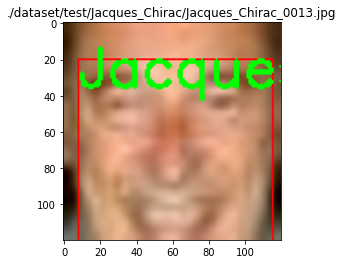

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0012.jpg
Jacques_Chirac
Name coreect
['Jacques_Chirac']
Correct face recognized
./dataset/test/Jacques_Chirac/Jacques_Chirac_0012.jpg


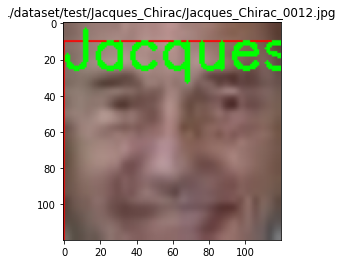

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0011.jpg
Donald_Rumsfeld
Name coreect
['Donald_Rumsfeld']
Correct face recognized
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0011.jpg


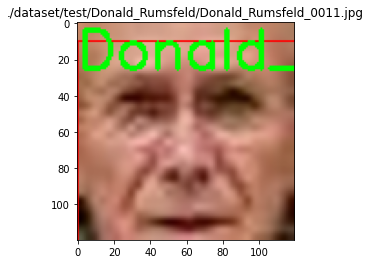

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0013.jpg
Unknown
Name coreect
['Donald_Rumsfeld']
Folder name is:  ['Donald_Rumsfeld'] . However, face detected is: ['Unknown']
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0013.jpg


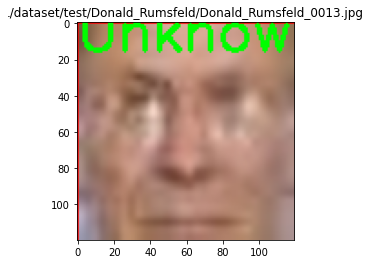

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0012.jpg
Donald_Rumsfeld
Name coreect
['Donald_Rumsfeld']
Correct face recognized
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0012.jpg


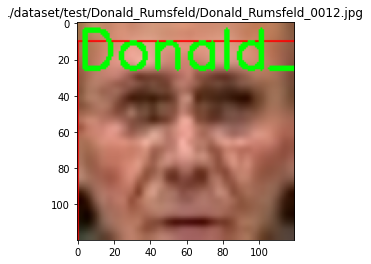

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0013.jpg
Ariel_Sharon
Name coreect
['Ariel_Sharon']
Correct face recognized
./dataset/test/Ariel_Sharon/Ariel_Sharon_0013.jpg


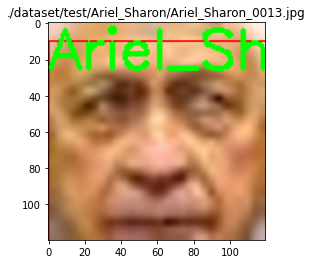

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0011.jpg
Ariel_Sharon
Name coreect
['Ariel_Sharon']
Correct face recognized
./dataset/test/Ariel_Sharon/Ariel_Sharon_0011.jpg


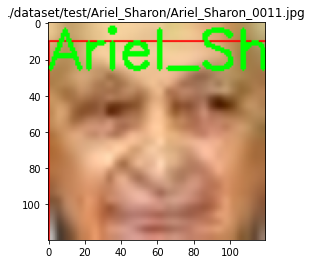

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0012.jpg
Unknown
Name coreect
['Ariel_Sharon']
Folder name is:  ['Ariel_Sharon'] . However, face detected is: ['Unknown']
./dataset/test/Ariel_Sharon/Ariel_Sharon_0012.jpg


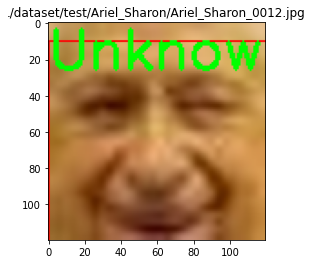

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0011.jpg
Hugo_Chavez
Name coreect
['Hugo_Chavez']
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0011.jpg


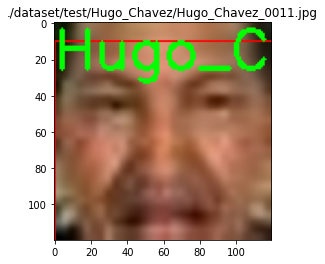

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0012.jpg
Hugo_Chavez
Name coreect
['Hugo_Chavez']
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0012.jpg


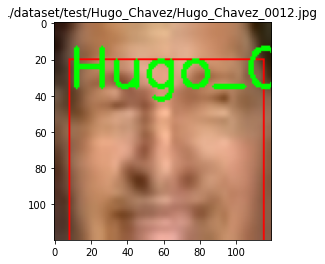

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0013.jpg
Hugo_Chavez
Name coreect
['Hugo_Chavez']
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0013.jpg


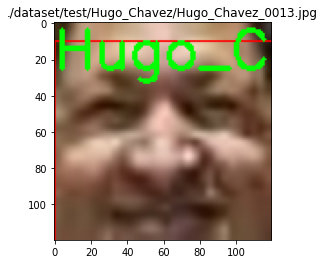

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0013.jpg
Serena_Williams
Name coreect
['Serena_Williams']
Correct face recognized
./dataset/test/Serena_Williams/Serena_Williams_0013.jpg


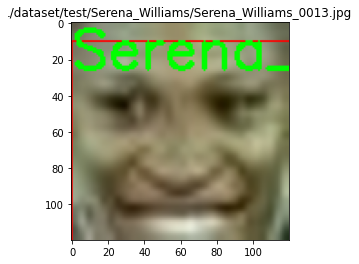

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0011.jpg
Name coreect
['Serena_Williams']
Folder name is:  ['Serena_Williams'] . However, face detected is: []
./dataset/test/Serena_Williams/Serena_Williams_0011.jpg


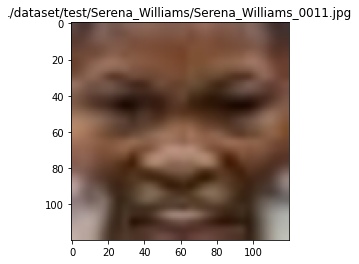

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0012.jpg
Name coreect
['Serena_Williams']
Folder name is:  ['Serena_Williams'] . However, face detected is: []
./dataset/test/Serena_Williams/Serena_Williams_0012.jpg


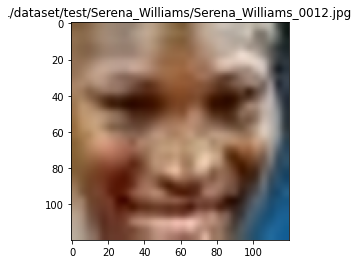

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0013.jpg
Jean_Chretien
Name coreect
['Jean_Chretien']
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0013.jpg


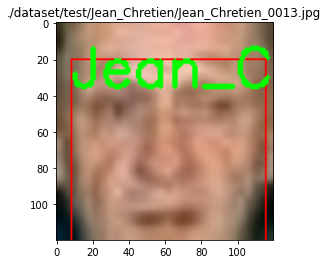

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0011.jpg
Jean_Chretien
Name coreect
['Jean_Chretien']
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0011.jpg


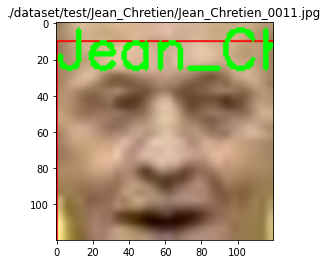

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0012.jpg
Jean_Chretien
Name coreect
['Jean_Chretien']
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0012.jpg


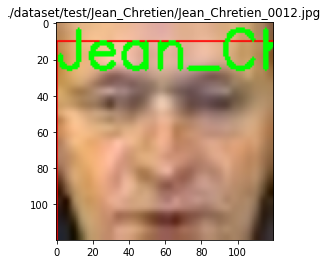

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0012.jpg
Gerhard_Schroeder
Name coreect
['Gerhard_Schroeder']
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0012.jpg


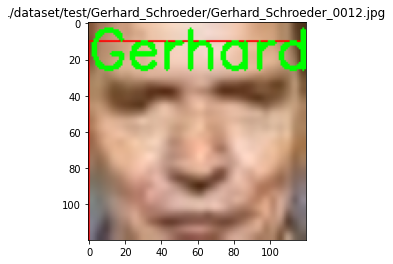

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0013.jpg
Gerhard_Schroeder
Name coreect
['Gerhard_Schroeder']
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0013.jpg


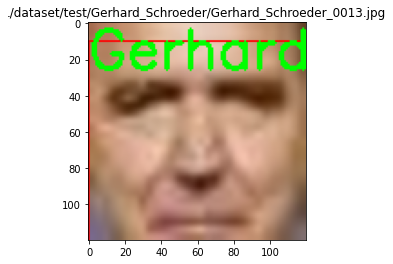

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0011.jpg
Gerhard_Schroeder
Name coreect
['Gerhard_Schroeder']
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0011.jpg


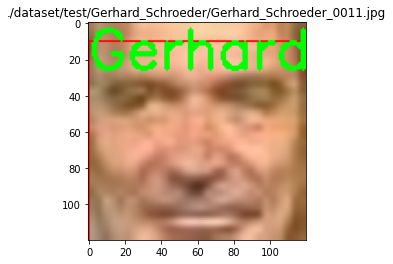

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0011.jpg
Junichiro_Koizumi
Name coreect
['Junichiro_Koizumi']
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0011.jpg


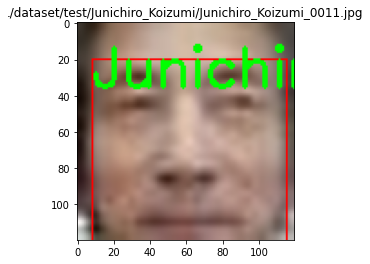

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0013.jpg
Junichiro_Koizumi
Name coreect
['Junichiro_Koizumi']
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0013.jpg


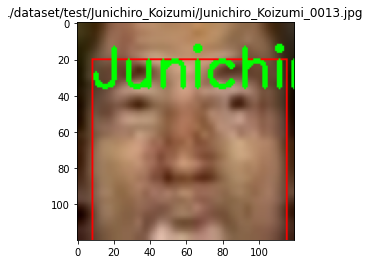

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0012.jpg
Junichiro_Koizumi
Name coreect
['Junichiro_Koizumi']
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0012.jpg


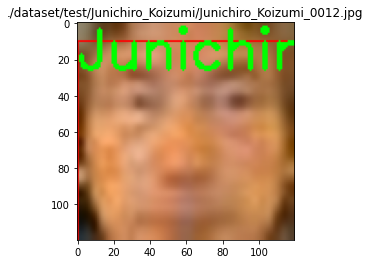

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0013.jpg
Jennifer_Capriati
Name coreect
['Jennifer_Capriati']
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0013.jpg


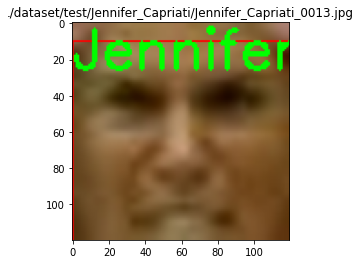

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0011.jpg
Jennifer_Capriati
Name coreect
['Jennifer_Capriati']
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0011.jpg


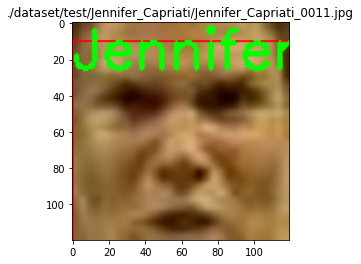

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0012.jpg
Jennifer_Capriati
Name coreect
['Jennifer_Capriati']
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0012.jpg


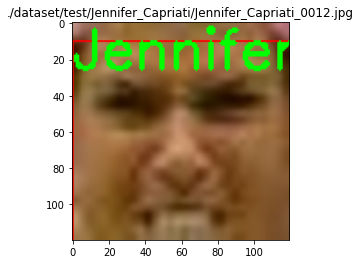

Summary
Total pictures 90
Faces identified correctly:  74
Faces identified wrongly:  11
Faces not identified:  5
Absolute Accuracy (correct / [correct + incorrect + not detected]) * 100%: 
82.0 %
Detection Accuracy [(correct + incorrect) / total] * 100%: 
94.44 %
END, time taken:  55.15 seconds
Avg. secs. per picture:  0.61 seconds


In [ ]:
recognize_face("scale")

[INFO] loading encodings...
[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0013.jpg
Roh_Moo-hyun
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0013.jpg


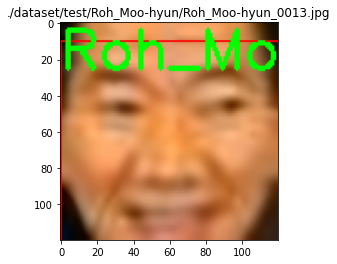

[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0011.jpg
Roh_Moo-hyun
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0011.jpg


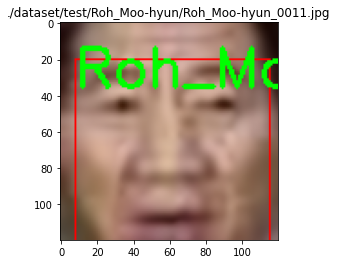

[INFO] recognizing faces in  ./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0012.jpg
Roh_Moo-hyun
Correct face recognized
./dataset/test/Roh_Moo-hyun/Roh_Moo-hyun_0012.jpg


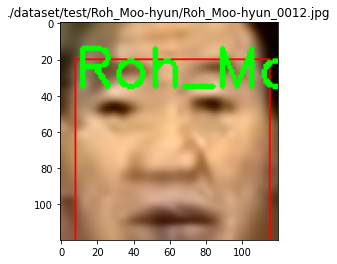

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0011.jpg
Gloria_Macapagal_Arroyo
Correct face recognized
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0011.jpg


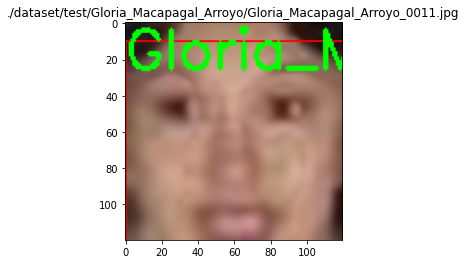

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0012.jpg
Gloria_Macapagal_Arroyo
Correct face recognized
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0012.jpg


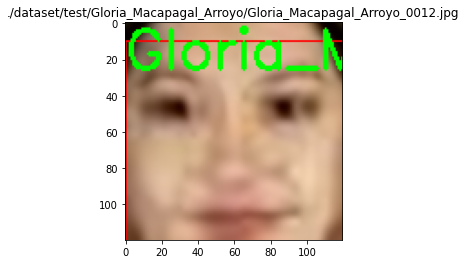

[INFO] recognizing faces in  ./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0013.jpg
Gloria_Macapagal_Arroyo
Correct face recognized
./dataset/test/Gloria_Macapagal_Arroyo/Gloria_Macapagal_Arroyo_0013.jpg


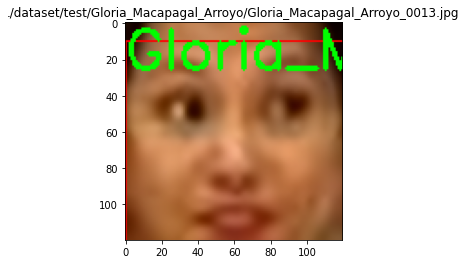

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0011.jpg
Hans_Blix
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0011.jpg


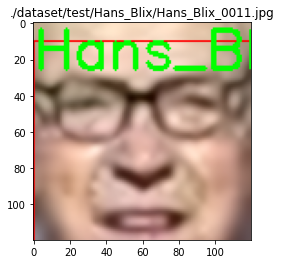

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0012.jpg
Hans_Blix
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0012.jpg


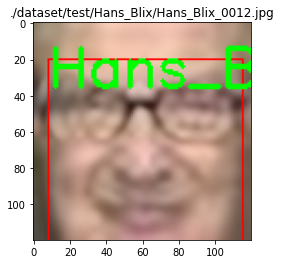

[INFO] recognizing faces in  ./dataset/test/Hans_Blix/Hans_Blix_0013.jpg
Hans_Blix
Correct face recognized
./dataset/test/Hans_Blix/Hans_Blix_0013.jpg


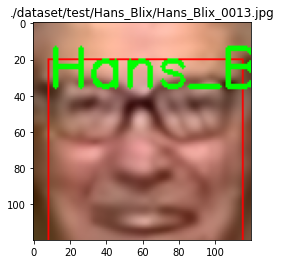

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0012.jpg
Silvio_Berlusconi
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0012.jpg


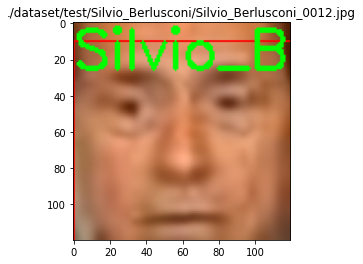

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0011.jpg
Silvio_Berlusconi
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0011.jpg


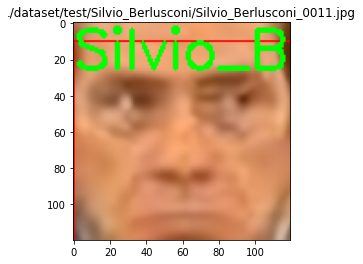

[INFO] recognizing faces in  ./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0013.jpg
Silvio_Berlusconi
Correct face recognized
./dataset/test/Silvio_Berlusconi/Silvio_Berlusconi_0013.jpg


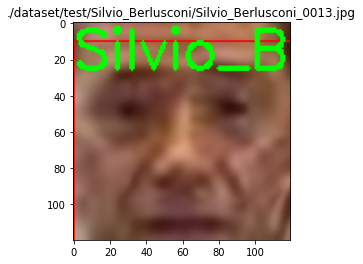

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0012.jpg
Laura_Bush
Correct face recognized
./dataset/test/Laura_Bush/Laura_Bush_0012.jpg


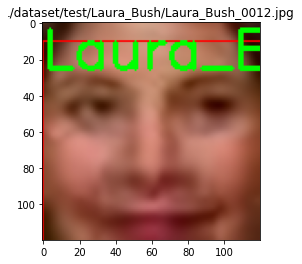

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0013.jpg
Laura_Bush
Correct face recognized
./dataset/test/Laura_Bush/Laura_Bush_0013.jpg


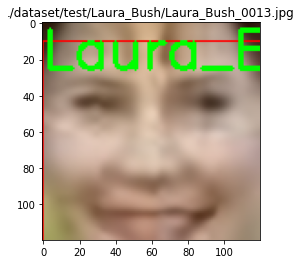

[INFO] recognizing faces in  ./dataset/test/Laura_Bush/Laura_Bush_0011.jpg
Laura_Bush
Correct face recognized
./dataset/test/Laura_Bush/Laura_Bush_0011.jpg


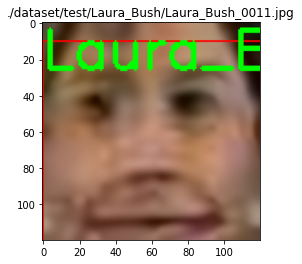

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0013.jpg
Gerhard_Schroeder
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Gerhard_Schroeder']
./dataset/test/John_Ashcroft/John_Ashcroft_0013.jpg


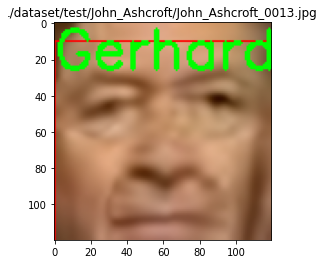

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0012.jpg
Unknown
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Unknown']
./dataset/test/John_Ashcroft/John_Ashcroft_0012.jpg


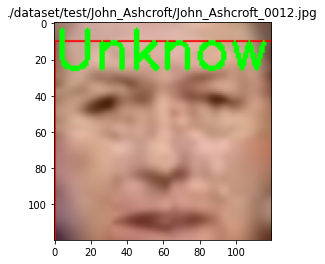

[INFO] recognizing faces in  ./dataset/test/John_Ashcroft/John_Ashcroft_0011.jpg
Unknown
Folder name is:  ['John_Ashcroft'] . However, face detected is: ['Unknown']
./dataset/test/John_Ashcroft/John_Ashcroft_0011.jpg


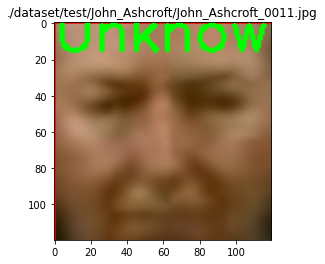

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0013.jpg
Tom_Ridge
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0013.jpg


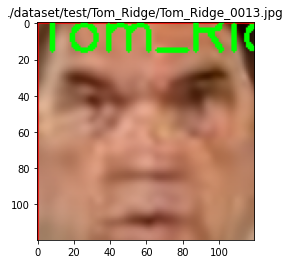

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0012.jpg
Tom_Ridge
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0012.jpg


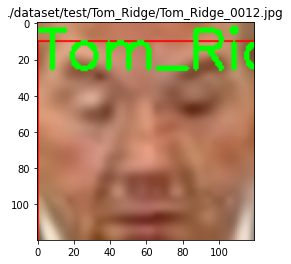

[INFO] recognizing faces in  ./dataset/test/Tom_Ridge/Tom_Ridge_0011.jpg
Tom_Ridge
Correct face recognized
./dataset/test/Tom_Ridge/Tom_Ridge_0011.jpg


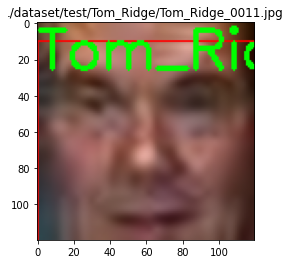

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0012.jpg
Andre_Agassi
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0012.jpg


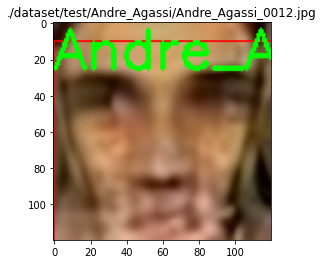

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0011.jpg
Andre_Agassi
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0011.jpg


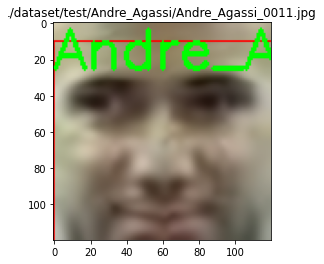

[INFO] recognizing faces in  ./dataset/test/Andre_Agassi/Andre_Agassi_0013.jpg
Andre_Agassi
Correct face recognized
./dataset/test/Andre_Agassi/Andre_Agassi_0013.jpg


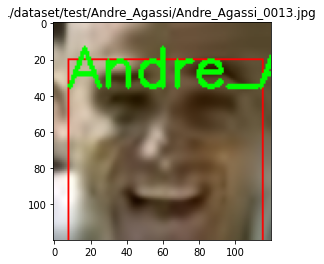

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0011.jpg
Vicente_Fox
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0011.jpg


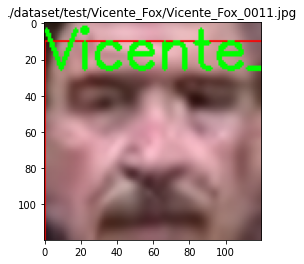

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0013.jpg
Vicente_Fox
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0013.jpg


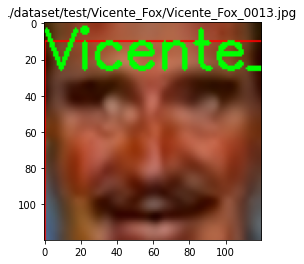

[INFO] recognizing faces in  ./dataset/test/Vicente_Fox/Vicente_Fox_0012.jpg
Vicente_Fox
Correct face recognized
./dataset/test/Vicente_Fox/Vicente_Fox_0012.jpg


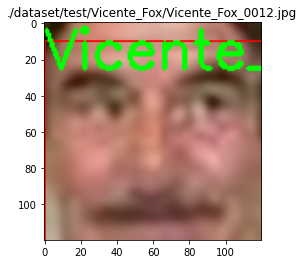

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0012.jpg
Arnold_Schwarzenegger
Folder name is:  ['Colin_Powell'] . However, face detected is: ['Arnold_Schwarzenegger']
./dataset/test/Colin_Powell/Colin_Powell_0012.jpg


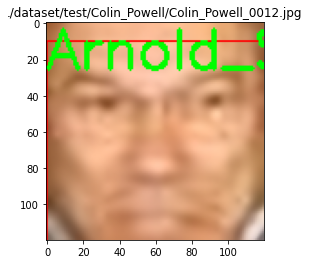

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0013.jpg
Tony_Blair
Folder name is:  ['Colin_Powell'] . However, face detected is: ['Tony_Blair']
./dataset/test/Colin_Powell/Colin_Powell_0013.jpg


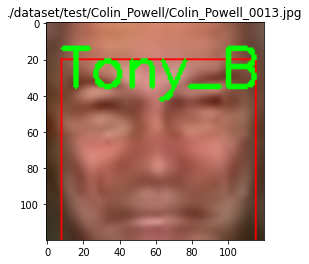

[INFO] recognizing faces in  ./dataset/test/Colin_Powell/Colin_Powell_0011.jpg
Tony_Blair
Folder name is:  ['Colin_Powell'] . However, face detected is: ['Tony_Blair']
./dataset/test/Colin_Powell/Colin_Powell_0011.jpg


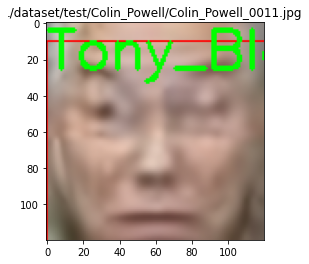

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0011.jpg
Unknown
Folder name is:  ['Luiz_Inacio_Lula_da_Silva'] . However, face detected is: ['Unknown']
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0011.jpg


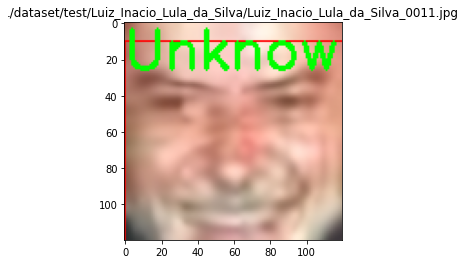

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0012.jpg
Luiz_Inacio_Lula_da_Silva
Correct face recognized
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0012.jpg


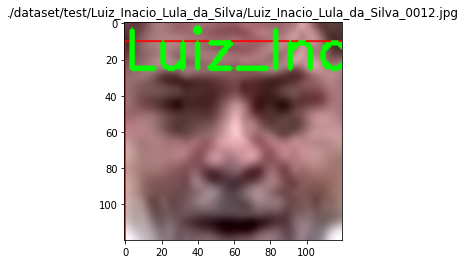

[INFO] recognizing faces in  ./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0013.jpg
Unknown
Folder name is:  ['Luiz_Inacio_Lula_da_Silva'] . However, face detected is: ['Unknown']
./dataset/test/Luiz_Inacio_Lula_da_Silva/Luiz_Inacio_Lula_da_Silva_0013.jpg


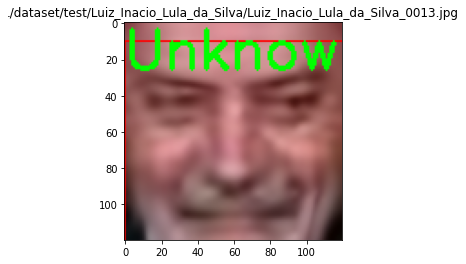

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0012.jpg
Alejandro_Toledo
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0012.jpg


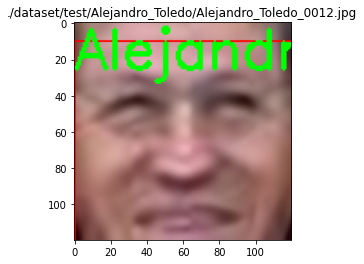

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0011.jpg
Alejandro_Toledo
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0011.jpg


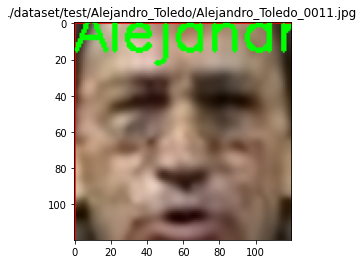

[INFO] recognizing faces in  ./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0013.jpg
Alejandro_Toledo
Correct face recognized
./dataset/test/Alejandro_Toledo/Alejandro_Toledo_0013.jpg


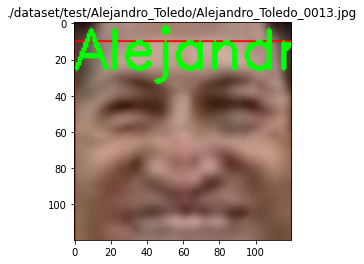

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0011.jpg
Megawati_Sukarnoputri
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0011.jpg


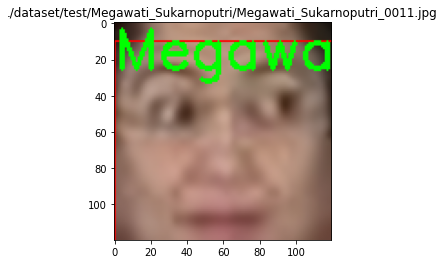

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0013.jpg
Megawati_Sukarnoputri
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0013.jpg


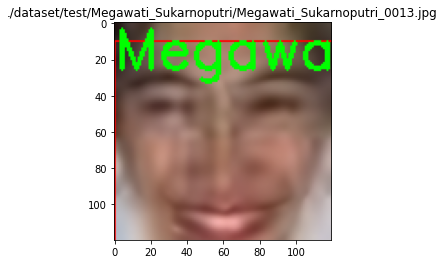

[INFO] recognizing faces in  ./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0012.jpg
Megawati_Sukarnoputri
Correct face recognized
./dataset/test/Megawati_Sukarnoputri/Megawati_Sukarnoputri_0012.jpg


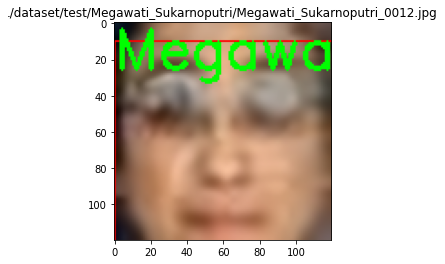

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0013.jpg
Lleyton_Hewitt
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0013.jpg


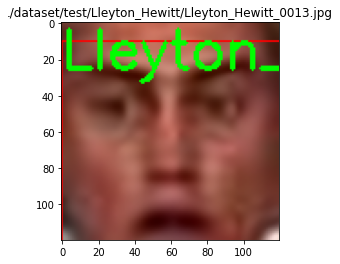

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0011.jpg
Lleyton_Hewitt
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0011.jpg


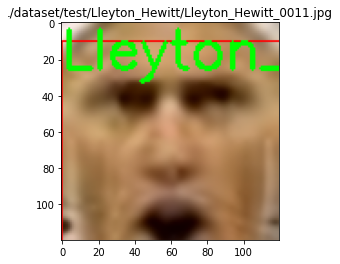

[INFO] recognizing faces in  ./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0012.jpg
Lleyton_Hewitt
Correct face recognized
./dataset/test/Lleyton_Hewitt/Lleyton_Hewitt_0012.jpg


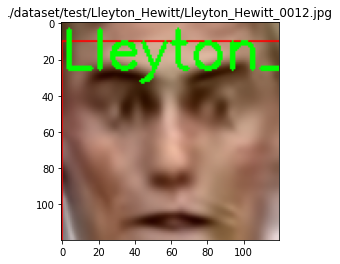

[INFO] recognizing faces in  ./dataset/test/Unknown/Aaron_Eckhart_A.jpg
Silvio_Berlusconi
Folder name is:  ['Unknown'] . However, face detected is: ['Silvio_Berlusconi']
./dataset/test/Unknown/Aaron_Eckhart_A.jpg


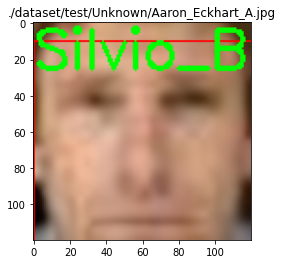

[INFO] recognizing faces in  ./dataset/test/Unknown/Aaron_Guiel_B.jpg
Folder name is:  ['Unknown'] . However, face detected is: []
./dataset/test/Unknown/Aaron_Guiel_B.jpg


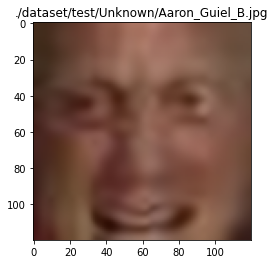

[INFO] recognizing faces in  ./dataset/test/Unknown/Adriana_Lima_C.jpg
Unknown
Correct face recognized
./dataset/test/Unknown/Adriana_Lima_C.jpg


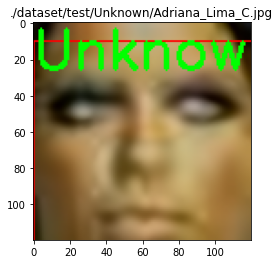

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0013.jpg
George_W_Bush
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0013.jpg


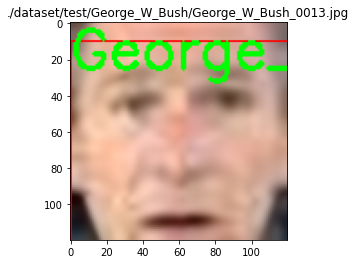

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0011.jpg
George_W_Bush
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0011.jpg


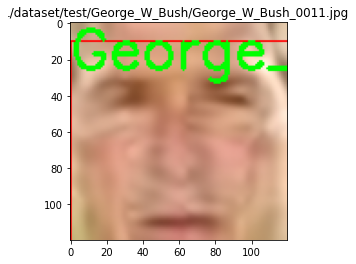

[INFO] recognizing faces in  ./dataset/test/George_W_Bush/George_W_Bush_0012.jpg
George_W_Bush
Correct face recognized
./dataset/test/George_W_Bush/George_W_Bush_0012.jpg


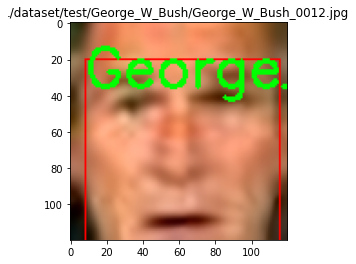

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0012.jpg
Nestor_Kirchner
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0012.jpg


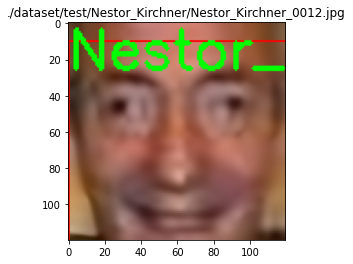

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0013.jpg
Nestor_Kirchner
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0013.jpg


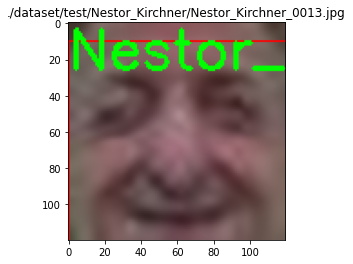

[INFO] recognizing faces in  ./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0011.jpg
Nestor_Kirchner
Correct face recognized
./dataset/test/Nestor_Kirchner/Nestor_Kirchner_0011.jpg


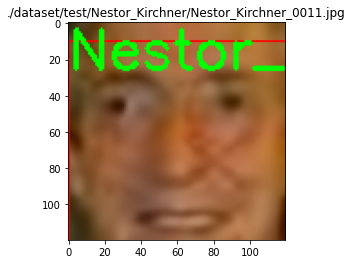

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0012.jpg
Alvaro_Uribe
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0012.jpg


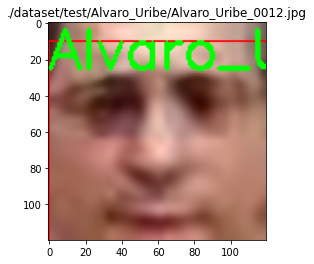

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0011.jpg
Alvaro_Uribe
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0011.jpg


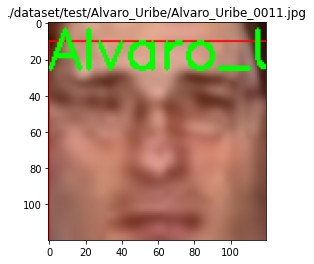

[INFO] recognizing faces in  ./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0013.jpg
Alvaro_Uribe
Correct face recognized
./dataset/test/Alvaro_Uribe/Alvaro_Uribe_0013.jpg


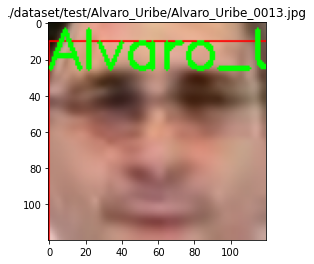

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0011.jpg
Tony_Blair
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0011.jpg


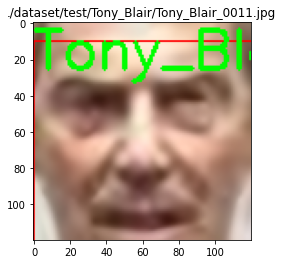

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0012.jpg
Tony_Blair
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0012.jpg


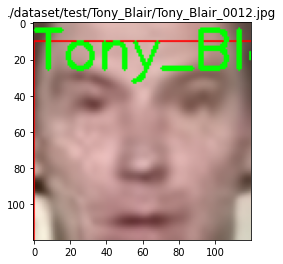

[INFO] recognizing faces in  ./dataset/test/Tony_Blair/Tony_Blair_0013.jpg
Tony_Blair
Correct face recognized
./dataset/test/Tony_Blair/Tony_Blair_0013.jpg


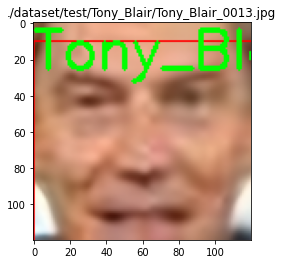

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0011.jpg
Kofi_Annan
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0011.jpg


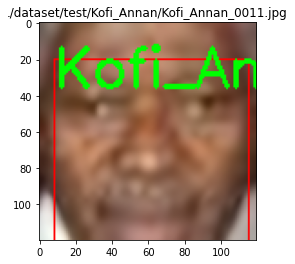

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0013.jpg
Kofi_Annan
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0013.jpg


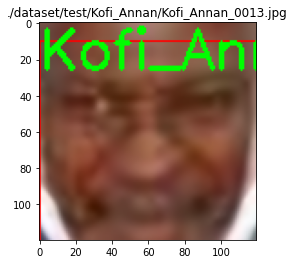

[INFO] recognizing faces in  ./dataset/test/Kofi_Annan/Kofi_Annan_0012.jpg
Kofi_Annan
Correct face recognized
./dataset/test/Kofi_Annan/Kofi_Annan_0012.jpg


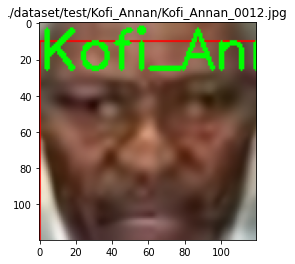

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0012.jpg
Arnold_Schwarzenegger
Correct face recognized
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0012.jpg


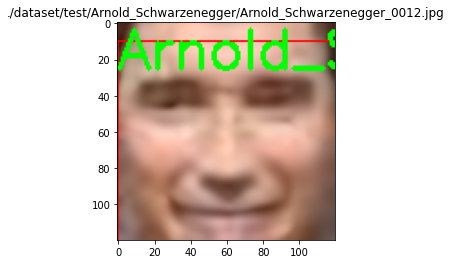

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0011.jpg
Folder name is:  ['Arnold_Schwarzenegger'] . However, face detected is: []
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0011.jpg


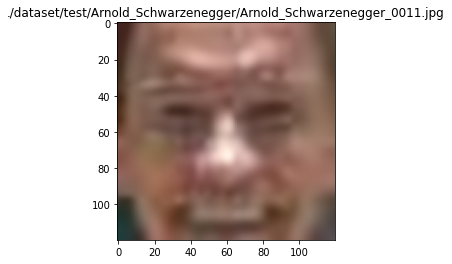

[INFO] recognizing faces in  ./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0013.jpg
Alvaro_Uribe
Folder name is:  ['Arnold_Schwarzenegger'] . However, face detected is: ['Alvaro_Uribe']
./dataset/test/Arnold_Schwarzenegger/Arnold_Schwarzenegger_0013.jpg


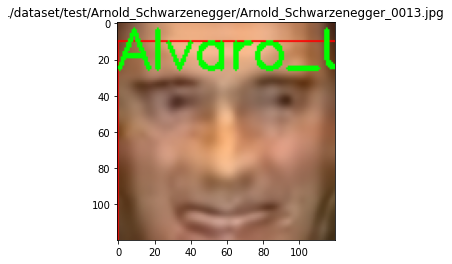

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0011.jpg
Jacques_Chirac
Correct face recognized
./dataset/test/Jacques_Chirac/Jacques_Chirac_0011.jpg


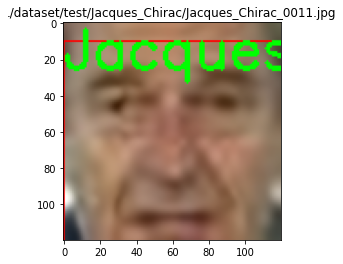

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0013.jpg
Jacques_Chirac
Correct face recognized
./dataset/test/Jacques_Chirac/Jacques_Chirac_0013.jpg


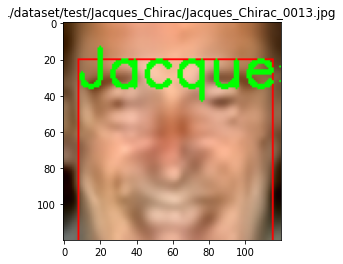

[INFO] recognizing faces in  ./dataset/test/Jacques_Chirac/Jacques_Chirac_0012.jpg
Jacques_Chirac
Correct face recognized
./dataset/test/Jacques_Chirac/Jacques_Chirac_0012.jpg


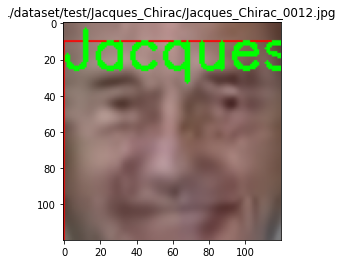

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0011.jpg
Donald_Rumsfeld
Correct face recognized
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0011.jpg


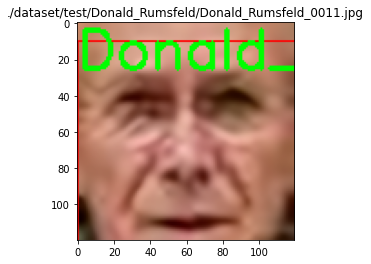

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0013.jpg
Silvio_Berlusconi
Folder name is:  ['Donald_Rumsfeld'] . However, face detected is: ['Silvio_Berlusconi']
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0013.jpg


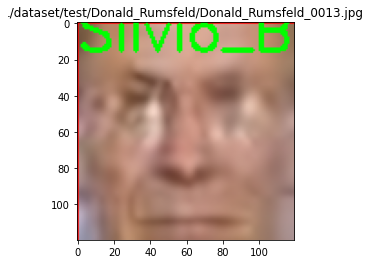

[INFO] recognizing faces in  ./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0012.jpg
Donald_Rumsfeld
Correct face recognized
./dataset/test/Donald_Rumsfeld/Donald_Rumsfeld_0012.jpg


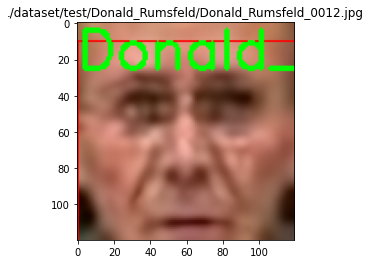

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0013.jpg
Ariel_Sharon
Correct face recognized
./dataset/test/Ariel_Sharon/Ariel_Sharon_0013.jpg


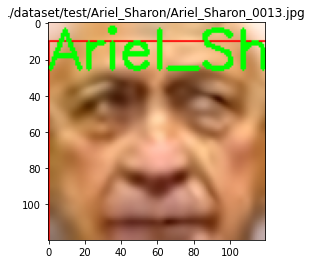

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0011.jpg
Ariel_Sharon
Correct face recognized
./dataset/test/Ariel_Sharon/Ariel_Sharon_0011.jpg


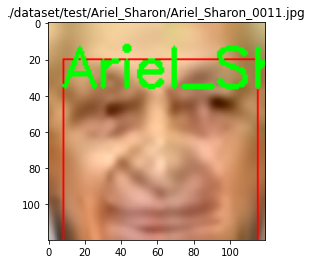

[INFO] recognizing faces in  ./dataset/test/Ariel_Sharon/Ariel_Sharon_0012.jpg
Unknown
Folder name is:  ['Ariel_Sharon'] . However, face detected is: ['Unknown']
./dataset/test/Ariel_Sharon/Ariel_Sharon_0012.jpg


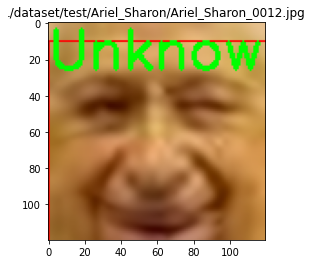

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0011.jpg
Hugo_Chavez
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0011.jpg


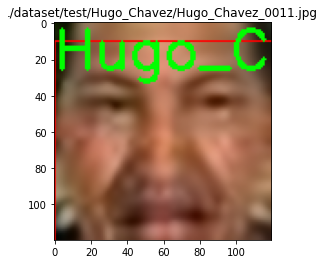

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0012.jpg
Hugo_Chavez
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0012.jpg


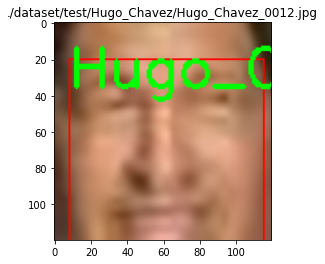

[INFO] recognizing faces in  ./dataset/test/Hugo_Chavez/Hugo_Chavez_0013.jpg
Hugo_Chavez
Correct face recognized
./dataset/test/Hugo_Chavez/Hugo_Chavez_0013.jpg


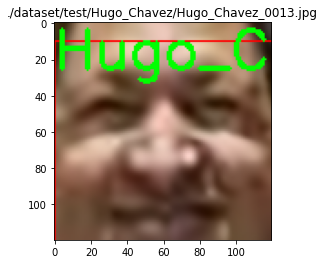

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0013.jpg
Serena_Williams
Correct face recognized
./dataset/test/Serena_Williams/Serena_Williams_0013.jpg


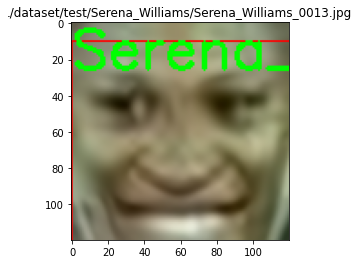

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0011.jpg
Folder name is:  ['Serena_Williams'] . However, face detected is: []
./dataset/test/Serena_Williams/Serena_Williams_0011.jpg


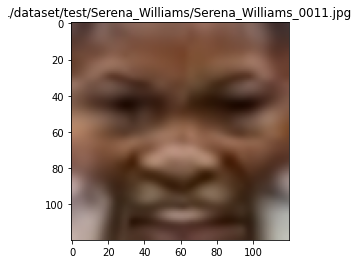

[INFO] recognizing faces in  ./dataset/test/Serena_Williams/Serena_Williams_0012.jpg
Folder name is:  ['Serena_Williams'] . However, face detected is: []
./dataset/test/Serena_Williams/Serena_Williams_0012.jpg


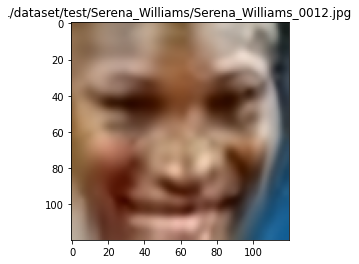

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0013.jpg
Jean_Chretien
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0013.jpg


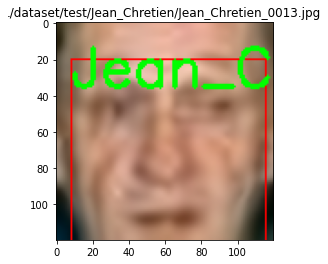

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0011.jpg
Jean_Chretien
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0011.jpg


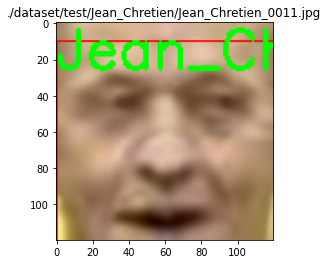

[INFO] recognizing faces in  ./dataset/test/Jean_Chretien/Jean_Chretien_0012.jpg
Jean_Chretien
Correct face recognized
./dataset/test/Jean_Chretien/Jean_Chretien_0012.jpg


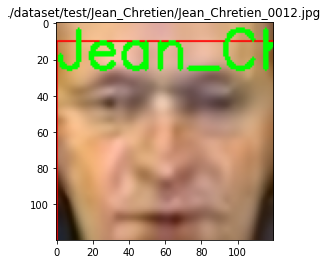

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0012.jpg
Gerhard_Schroeder
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0012.jpg


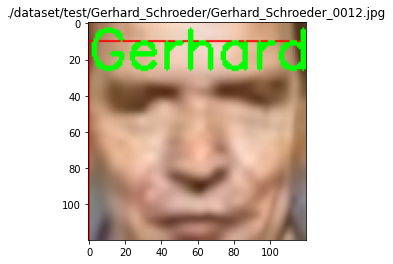

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0013.jpg
Gerhard_Schroeder
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0013.jpg


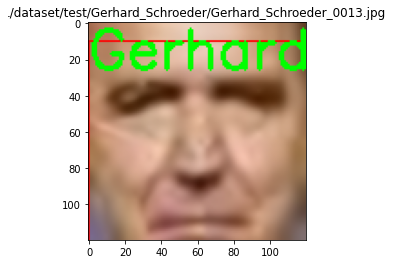

[INFO] recognizing faces in  ./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0011.jpg
Gerhard_Schroeder
Correct face recognized
./dataset/test/Gerhard_Schroeder/Gerhard_Schroeder_0011.jpg


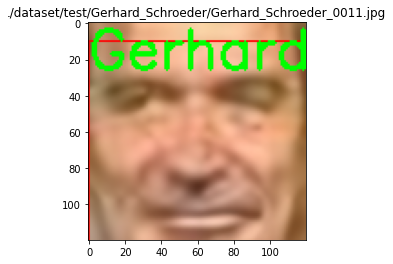

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0011.jpg
Junichiro_Koizumi
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0011.jpg


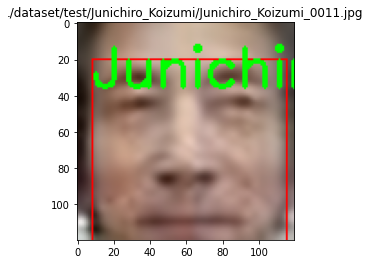

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0013.jpg
Junichiro_Koizumi
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0013.jpg


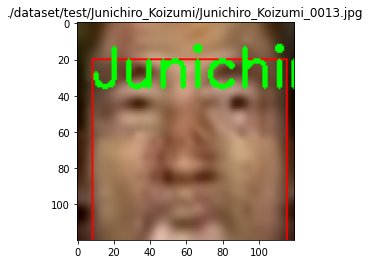

[INFO] recognizing faces in  ./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0012.jpg
Junichiro_Koizumi
Correct face recognized
./dataset/test/Junichiro_Koizumi/Junichiro_Koizumi_0012.jpg


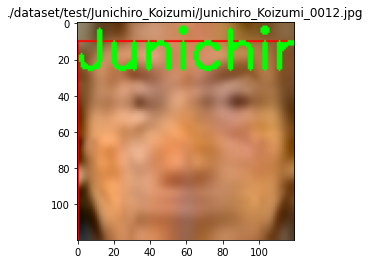

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0013.jpg
Jennifer_Capriati
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0013.jpg


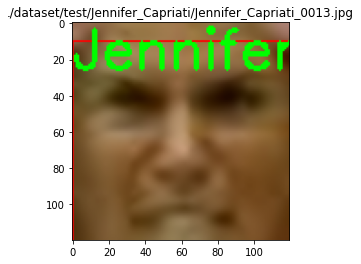

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0011.jpg
Jennifer_Capriati
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0011.jpg


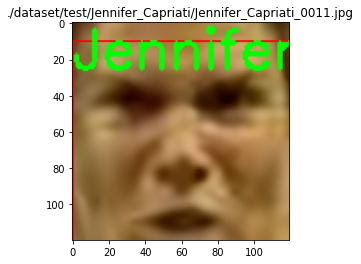

[INFO] recognizing faces in  ./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0012.jpg
Jennifer_Capriati
Correct face recognized
./dataset/test/Jennifer_Capriati/Jennifer_Capriati_0012.jpg


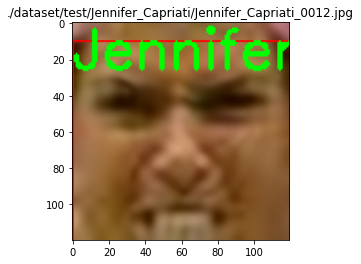

Summary
Total pictures 90
Faces identified correctly:  74
Faces identified wrongly:  12
Faces not identified:  4
Absolute Accuracy (correct / [correct + incorrect + not detected]) * 100%: 
82.0 %
Detection Accuracy [(correct + incorrect) / total] * 100%: 
95.56 %
END, time taken:  332.48 seconds
Avg. secs. per picture:  3.69 seconds


In [19]:
recognize_face("ai")